In [154]:
import pandas as pd
import random

def get_recommended_courses(userId):
    # Load the courses data from the CSV file
    courses_df = pd.read_csv(r'C:/Users/AnanyaSarkar/Documents/project/datascienceandengg/staging/transformed/transformed_courses.csv')
    
    # Check if the DataFrame is empty
    if courses_df.empty:
        print("No courses available.")
        return []

    # Randomly select 3 unique courses from the DataFrame
    recommended_courses = courses_df.sample(n=3, random_state=random.randint(0, 1000))  # random_state for reproducibility

    # Extract course_id and title
    recommended_courses_list = recommended_courses[['courseId', 'title']].values.tolist()

    return recommended_courses_list

   courseId                                          title proficiency_level  \
0         1                    Java Programming Essentials          Beginner   
1         2  Mastering Java Swing for Desktop Applications          Beginner   
2         3                        SQL for Data Management          Advanced   
3         4                    C Programming for Beginners          Beginner   
4         5                         Advanced C# Techniques          Advanced   

   chapters  duration  course_age duration_category  \
0         5         2        1634             Short   
1         9        10        1487              Long   
2        10        10         150              Long   
3        15         7        1096            Medium   
4         7         5        1321            Medium   

   proficiency_level_encoded  created_day  created_month  created_year  
0                          1           18              4          2020  
1                          1           12 

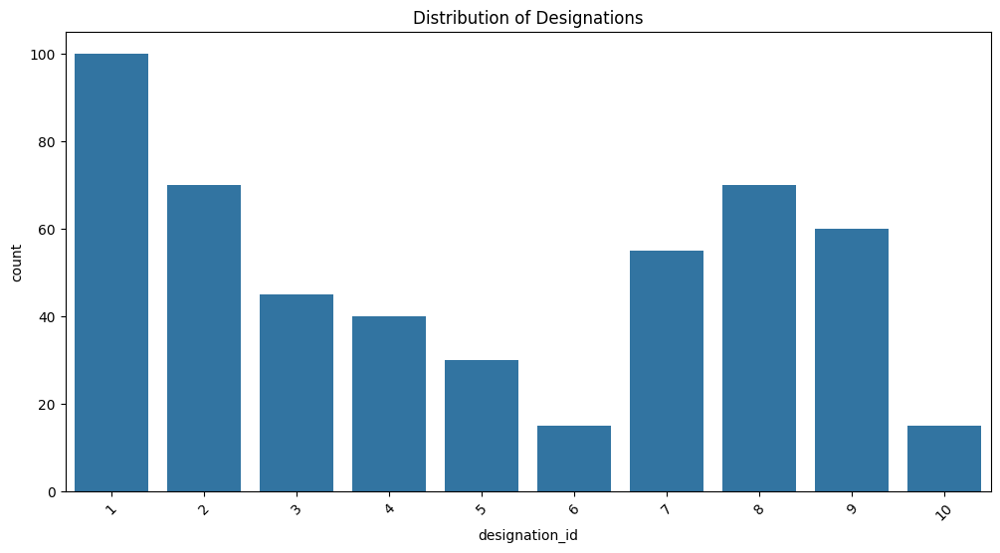

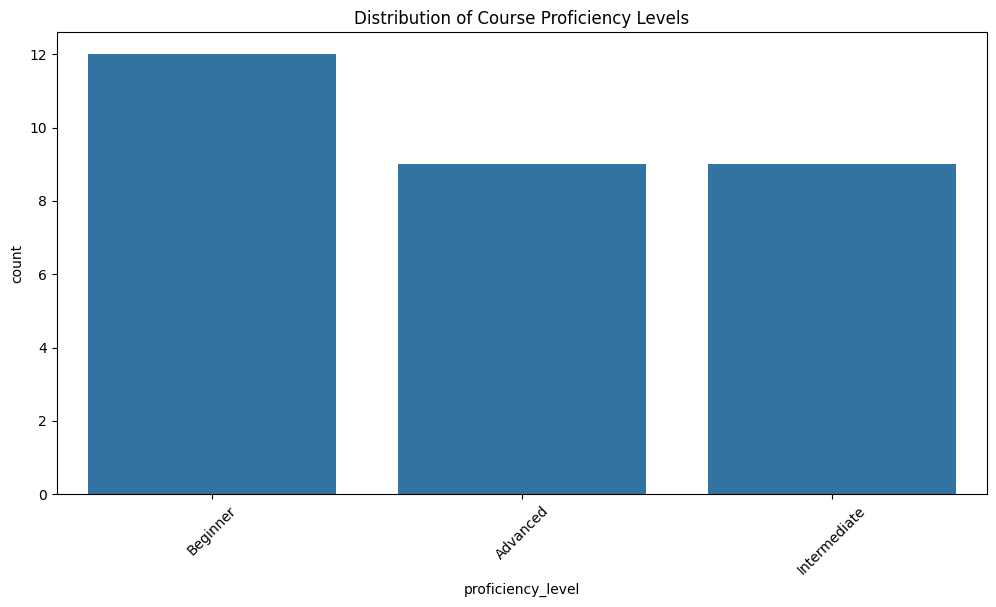

In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load datasets
courses_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_courses.csv')
progress_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_progress.csv')
users_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_users.csv')
user_skills_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\user_skills.csv')
designations_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\designations.csv')
designations_skill_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\designations_skill.csv')

# Check the data
print(courses_df.head())
print(progress_df.head())
print(users_df.head())
print(user_skills_df.head())

# EDA: Check distributions of courses and users
plt.figure(figsize=(12, 6))
sns.countplot(data=users_df, x='designation_id')
plt.title('Distribution of Designations')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(data=courses_df, x='proficiency_level')
plt.title('Distribution of Course Proficiency Levels')
plt.xticks(rotation=45)
plt.show()


In [43]:
# Merge user skills with designations to find missing skills
user_skills_with_designations = pd.merge(user_skills_df, designations_skill_df, left_on='skillId',  right_on='skill_id', how='left')
user_skills_with_designations = pd.merge(user_skills_with_designations, designations_df, on='id', how='left')

# Create a list of required skills for each designation
required_skills_per_designation = user_skills_with_designations.groupby('id')['skill_id'].apply(list).reset_index()
required_skills_per_designation.columns = ['id', 'required_skills']

# Create a list of available skills for each course
course_skills = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')
course_skills_list = course_skills.groupby('courseId')['skillId'].apply(list).reset_index()
course_skills_list.columns = ['courseId', 'available_skills']

# Merge required skills with courses to check for matches


In [49]:
print("Required Skills Columns:", required_skills_per_designation.columns.tolist())
print("Course Skills List Columns:", course_skills_list.columns.tolist())


Required Skills Columns: ['designation_id', 'required_skills']
Course Skills List Columns: ['courseId', 'available_skills']


In [50]:
required_skills_per_designation['required_skills'] = required_skills_per_designation['required_skills'].apply(lambda x: x if isinstance(x, list) else [x])
course_skills_list['available_skills'] = course_skills_list['available_skills'].apply(lambda x: x if isinstance(x, list) else [x])

# Explode the DataFrames to have one skill per row
required_skills_per_designation = required_skills_per_designation.explode('required_skills')
course_skills_list = course_skills_list.explode('available_skills')

# Merge required skills with courses based on skills
course_recommendations = pd.merge(
    required_skills_per_designation,
    course_skills_list,
    left_on='required_skills',  # Match against the available skills list
    right_on='available_skills',  # Match against the available skills list
    how='inner'
)

In [44]:
print(required_skills_per_designation.columns)
print(course_skills_list.columns)


Index(['id', 'required_skills'], dtype='object')
Index(['courseId', 'available_skills'], dtype='object')


   courseId                                          title proficiency_level  \
0         1                    Java Programming Essentials          Beginner   
1         2  Mastering Java Swing for Desktop Applications          Beginner   
2         3                        SQL for Data Management          Advanced   
3         4                    C Programming for Beginners          Beginner   
4         5                         Advanced C# Techniques          Advanced   

   chapters  duration  course_age duration_category  \
0         5         2        1634             Short   
1         9        10        1487              Long   
2        10        10         150              Long   
3        15         7        1096            Medium   
4         7         5        1321            Medium   

   proficiency_level_encoded  created_day  created_month  created_year  
0                          1           18              4          2020  
1                          1           12 

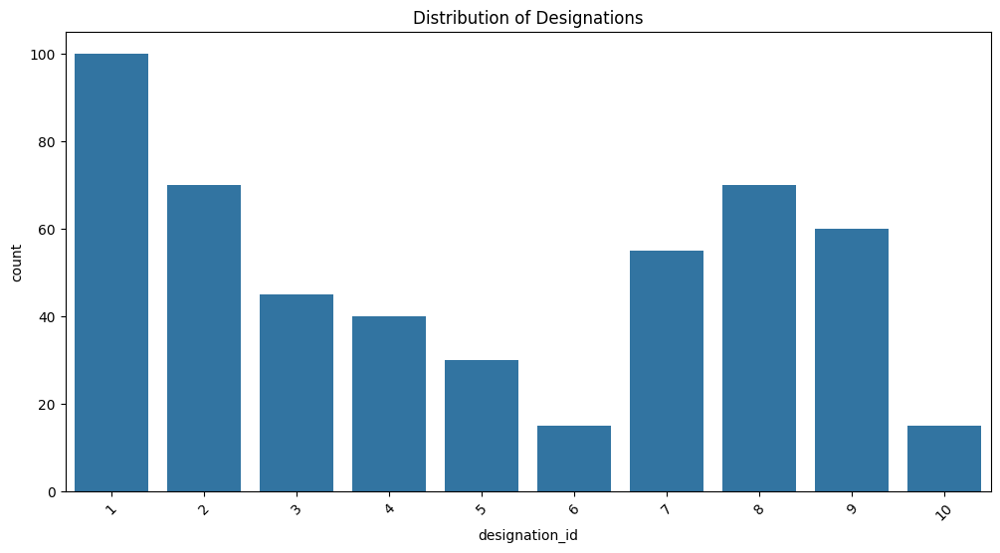

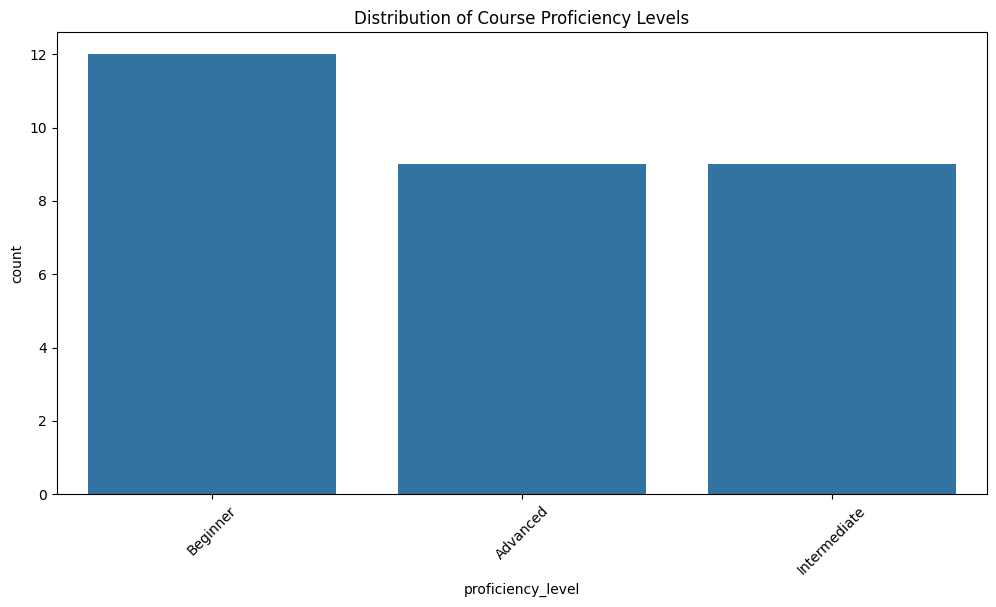

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load datasets
courses_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_courses.csv')
progress_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_progress.csv')
users_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_users.csv')
user_skills_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\user_skills.csv')
designations_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\designations.csv')
designations_skill_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\designations_skill.csv')

# Check the data
print(courses_df.head())
print(progress_df.head())
print(users_df.head())
print(user_skills_df.head())

# EDA: Check distributions of courses and users
plt.figure(figsize=(12, 6))
sns.countplot(data=users_df, x='designation_id')
plt.title('Distribution of Designations')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(data=courses_df, x='proficiency_level')
plt.title('Distribution of Course Proficiency Levels')
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Merge user skills with designations to find missing skills
user_skills_with_designations = pd.merge(user_skills_df, designations_skill_df, left_on='skillId',  right_on='skill_id', how='left')
user_skills_with_designations = pd.merge(user_skills_with_designations, designations_df, on='id', how='left')

# Create a list of required skills for each designation
required_skills_per_designation = user_skills_with_designations.groupby('id')['skill_id'].apply(list).reset_index()
required_skills_per_designation.columns = ['id', 'required_skills']

# Create a list of available skills for each course
course_skills = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')
course_skills_list = course_skills.groupby('courseId')['skillId'].apply(list).reset_index()
course_skills_list.columns = ['courseId', 'available_skills']

# Merge required skills with courses to check for matches


In [ ]:
print("Required Skills Columns:", required_skills_per_designation.columns.tolist())
print("Course Skills List Columns:", course_skills_list.columns.tolist())


Required Skills Columns: ['designation_id', 'required_skills']
Course Skills List Columns: ['courseId', 'available_skills']


In [ ]:
required_skills_per_designation['required_skills'] = required_skills_per_designation['required_skills'].apply(lambda x: x if isinstance(x, list) else [x])
course_skills_list['available_skills'] = course_skills_list['available_skills'].apply(lambda x: x if isinstance(x, list) else [x])

# Explode the DataFrames to have one skill per row
required_skills_per_designation = required_skills_per_designation.explode('required_skills')
course_skills_list = course_skills_list.explode('available_skills')

# Merge required skills with courses based on skills
course_recommendations = pd.merge(
    required_skills_per_designation,
    course_skills_list,
    left_on='required_skills',  # Match against the available skills list
    right_on='available_skills',  # Match against the available skills list
    how='inner'
)

In [ ]:
print(required_skills_per_designation.columns)
print(course_skills_list.columns)


Index(['id', 'required_skills'], dtype='object')
Index(['courseId', 'available_skills'], dtype='object')


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a list of available skills for each course
course_skills = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')
course_skills_list = course_skills.groupby('courseId')['skillId'].apply(lambda x: ', '.join(map(str, x))).reset_index()
course_skills_list.columns = ['courseId', 'available_skills']

# Create TF-IDF features for available skills
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(course_skills_list['available_skills'])

# Create a DataFrame for course similarity
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

# Function to get course recommendations based on content similarity
def get_content_based_recommendations(course_id, num_recommendations=5):
    # Get index of the course that matches the course_id
    idx = course_skills_list[course_skills_list['courseId'] == course_id].index[0]
    
    # Get the pairwise similarity scores of all courses with that course
    sim_scores = list(enumerate(cosine_sim[idx]))
    
    # Sort the courses based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar courses
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the course indices
    course_indices = [i[0] for i in sim_scores]
    
    # Return the top most similar courses
    return course_skills_list['courseId'].iloc[course_indices].tolist()


In [89]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

# Function to get course recommendations based on content similarity
def get_content_based_recommendations(course_id, num_recommendations=5):
    # Get index of the course that matches the course_id
    idx = course_skills_list[course_skills_list['courseId'] == course_id].index[0]
    
    # Get the pairwise similarity scores of all courses with that course
    sim_scores = list(enumerate(cosine_sim[idx]))
    
    # Sort the courses based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar courses
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the course indices
    course_indices = [i[0] for i in sim_scores]
    
    # Return the top most similar courses
    return course_skills_list['courseId'].iloc[course_indices].tolist()


In [88]:
# User-Item matrix creation
user_course_matrix = progress_df.pivot_table(index='userId', columns='courseId', values='percentage_completed', fill_value=0)

# Calculate cosine similarity
user_similarity = cosine_similarity(user_course_matrix)

# Function to get collaborative filtering recommendations
def get_collaborative_recommendations(user_id, num_recommendations=5):
    # Get index of the user that matches user_id
    idx = users_df[users_df['user_id'] == user_id].index[0]
    
    # Get the pairwise similarity scores of all users with that user
    sim_scores = list(enumerate(user_similarity[idx]))
    
    # Sort the users based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar users
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the user indices
    user_indices = [i[0] for i in sim_scores]
    
    # Get recommended courses for those users
    recommended_courses = user_course_matrix.iloc[user_indices].sum(axis=0).sort_values(ascending=False)
    return recommended_courses[recommended_courses > 0].index.tolist()[:num_recommendations]


In [ ]:
# Load the course skills data
course_skills_list = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')

# Convert skillId to strings and then join
course_skills = course_skills_list.groupby('courseId')['skillId'].apply(lambda x: ' '.join(x.astype(str))).reset_index()
course_skills.columns = ['courseId', 'skills']

# Now you can proceed with your further operations
print(course_skills)

    courseId          skills
0          1           27 31
1          2          28 6 3
2          3   29 13 31 26 1
3          4            16 7
4          5              10
5          6               5
6          7               7
7          8      31 30 18 7
8          9  15 17 14 27 21
9         10              17
10        11         9 22 24
11        12           31 23
12        13   11 27 15 20 7
13        14            25 7
14        15           17 25
15        16            5 21
16        17            24 9
17        18          9 5 21
18        19        25 26 12
19        20   9 14 23 27 17
20        21         23 5 10
21        22      16 29 9 28
22        23               9
23        24    21 4 8 30 11
24        25       3 4 28 13
25        26         4 30 31
26        27      16 32 15 5
27        28   10 14 8 16 23
28        29         19 7 18
29        30               8


user_id = 1  
course_id = 1  

recommended_courses = hybrid_recommendation(user_id, course_id)

print("Recommended Courses:")
print(recommended_courses)


In [96]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

# Create a TF-IDF vectorizer
tfidf = TfidfVectorizer()

# Transform the skills into a TF-IDF matrix
tfidf_matrix = tfidf.fit_transform(course_skills['skills'])

# Compute the cosine similarity matrix
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

# Function to get course recommendations based on content
def get_content_recommendations(course_id, cosine_sim=cosine_sim):
    idx = course_skills[course_skills['courseId'] == course_id].index[0]
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    course_indices = [i[0] for i in sim_scores[1:6]]  # Top 5 recommendations
    return course_skills['courseId'].iloc[course_indices].values
from sklearn.decomposition import TruncatedSVD

# Fit SVD on the user-course matrix
svd = TruncatedSVD(n_components=5)
matrix_factorization = svd.fit_transform(user_course_matrix)

# Function to get collaborative recommendations
def get_collaborative_recommendations(user_id, user_course_matrix=user_course_matrix):
    user_idx = user_course_matrix.index.get_loc(user_id)
    sim_scores = user_course_matrix.dot(matrix_factorization[user_idx])
    course_indices = sim_scores.argsort()[-5:][::-1]  # Top 5 recommendations
    return user_course_matrix.columns[course_indices].values
def hybrid_recommendations(user_id, course_id):
    content_recs = get_content_recommendations(course_id)
    collaborative_recs = get_collaborative_recommendations(user_id)
    # Combine and remove duplicates
    recommendations = set(content_recs) | set(collaborative_recs)
    return list(recommendations)


In [95]:
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error
import numpy as np

def evaluate_model(predictions, true_labels):
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    rmse = np.sqrt(mean_squared_error(true_labels, predictions))
    
    return {
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'RMSE': rmse
    }


In [94]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(user_course_matrix, test_size=0.2, random_state=42)
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error
import numpy as np

def evaluate_model(predictions, true_labels):
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    rmse = np.sqrt(mean_squared_error(true_labels, predictions))
    
    return {
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'RMSE': rmse
    }


In [90]:
from sklearn.decomposition import TruncatedSVD

# Fit SVD on the user-course matrix, adjusting components
svd = TruncatedSVD(n_components=30)  # Match this with the number of courses
matrix_factorization = svd.fit_transform(user_course_matrix)

def get_collaborative_recommendations(user_id):
    user_idx = user_course_matrix.index.get_loc(user_id)
    # Ensure that the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)  # Transpose to align dimensions
    sim_scores = sim_scores.values.flatten()  # Convert to a NumPy array and flatten it

    # Get the top 5 indices, ensuring we do not exceed the length of available columns
    num_courses = user_course_matrix.shape[1]  # Number of courses
    course_indices = sim_scores.argsort()[-5:][::-1]  # Top 5 recommendations

    # Filter course_indices to ensure they are within bounds
    valid_course_indices = [i for i in course_indices if i < num_courses]
    
    return user_course_matrix.columns[valid_course_indices].values


def get_predictions(user_id, course_id, method='hybrid'):
    if method == 'content':
        return get_content_recommendations(course_id)
    elif method == 'collaborative':
        return get_collaborative_recommendations(user_id)
    elif method == 'hybrid':
        return hybrid_recommendations(user_id, course_id)
    else:
        raise ValueError("Unknown method specified.")

# When calling for predictions
for user_id in test_data.index:
    for course_id in test_data.columns:
        if test_data.loc[user_id, course_id] > 0:  # If the user has interacted with this course
            # Get predictions from all three methods
            content_preds = get_predictions(user_id, course_id, method='content')
            collaborative_preds = get_predictions(user_id, course_id, method='collaborative')
            hybrid_preds = get_predictions(user_id, course_id, method='hybrid')


In [93]:
def get_collaborative_recommendations(user_id):
    # Check if the user exists in the user-course matrix
    if user_id not in user_course_matrix.index:
        return ["No collaborative recs"]  # Return no recommendation if user not found
    
    user_idx = user_course_matrix.index.get_loc(user_id)  # Get the index for the user
    
    # Ensure the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)
    
    # Check if user_idx is within the bounds of sim_scores
    if user_idx >= sim_scores.shape[0]:
        return ["No collaborative recs"]
    
    sim_scores = sim_scores[user_idx, :].flatten()  # Get scores for this user
    
    # Get top 5 course indices
    course_indices = np.argsort(sim_scores)[-5:][::-1]
    
    # Filter out any indices that are out of bounds
    valid_course_indices = [i for i in course_indices if i < user_course_matrix.shape[1]]
    
    if len(valid_course_indices) > 0:
        return user_course_matrix.columns[valid_course_indices].values
    else:
        return ["No collaborative recs"]


In [92]:
from sklearn.decomposition import TruncatedSVD
import numpy as np

# Fit SVD on the user-course matrix
svd = TruncatedSVD(n_components=30)  # Adjust number of components based on your data
matrix_factorization = svd.fit_transform(user_course_matrix)
def get_predictions(user_id, course_id, method='hybrid'):
    if method == 'content':
        return get_content_recommendations(course_id)
    elif method == 'collaborative':
        return get_collaborative_recommendations(user_id)
    elif method == 'hybrid':
        return hybrid_recommendations(user_id, course_id)
    else:
        raise ValueError("Unknown method specified.")


In [52]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a list of available skills for each course
course_skills = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')
course_skills_list = course_skills.groupby('courseId')['skillId'].apply(lambda x: ', '.join(map(str, x))).reset_index()
course_skills_list.columns = ['courseId', 'available_skills']

# Create TF-IDF features for available skills
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(course_skills_list['available_skills'])

# Create a DataFrame for course similarity
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())


In [53]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

# Function to get course recommendations based on content similarity
def get_content_based_recommendations(course_id, num_recommendations=5):
    # Get index of the course that matches the course_id
    idx = course_skills_list[course_skills_list['courseId'] == course_id].index[0]
    
    # Get the pairwise similarity scores of all courses with that course
    sim_scores = list(enumerate(cosine_sim[idx]))
    
    # Sort the courses based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar courses
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the course indices
    course_indices = [i[0] for i in sim_scores]
    
    # Return the top most similar courses
    return course_skills_list['courseId'].iloc[course_indices].tolist()


In [54]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

# Function to get course recommendations based on content similarity
def get_content_based_recommendations(course_id, num_recommendations=5):
    # Get index of the course that matches the course_id
    idx = course_skills_list[course_skills_list['courseId'] == course_id].index[0]
    
    # Get the pairwise similarity scores of all courses with that course
    sim_scores = list(enumerate(cosine_sim[idx]))
    
    # Sort the courses based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar courses
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the course indices
    course_indices = [i[0] for i in sim_scores]
    
    # Return the top most similar courses
    return course_skills_list['courseId'].iloc[course_indices].tolist()


In [55]:
# User-Item matrix creation
user_course_matrix = progress_df.pivot_table(index='userId', columns='courseId', values='percentage_completed', fill_value=0)

# Calculate cosine similarity
user_similarity = cosine_similarity(user_course_matrix)

# Function to get collaborative filtering recommendations
def get_collaborative_recommendations(user_id, num_recommendations=5):
    # Get index of the user that matches user_id
    idx = users_df[users_df['user_id'] == user_id].index[0]
    
    # Get the pairwise similarity scores of all users with that user
    sim_scores = list(enumerate(user_similarity[idx]))
    
    # Sort the users based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar users
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the user indices
    user_indices = [i[0] for i in sim_scores]
    
    # Get recommended courses for those users
    recommended_courses = user_course_matrix.iloc[user_indices].sum(axis=0).sort_values(ascending=False)
    return recommended_courses[recommended_courses > 0].index.tolist()[:num_recommendations]


In [64]:
# Load the course skills data
course_skills_list = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')

# Convert skillId to strings and then join
course_skills = course_skills_list.groupby('courseId')['skillId'].apply(lambda x: ' '.join(x.astype(str))).reset_index()
course_skills.columns = ['courseId', 'skills']

# Now you can proceed with your further operations
print(course_skills)

    courseId          skills
0          1           27 31
1          2          28 6 3
2          3   29 13 31 26 1
3          4            16 7
4          5              10
5          6               5
6          7               7
7          8      31 30 18 7
8          9  15 17 14 27 21
9         10              17
10        11         9 22 24
11        12           31 23
12        13   11 27 15 20 7
13        14            25 7
14        15           17 25
15        16            5 21
16        17            24 9
17        18          9 5 21
18        19        25 26 12
19        20   9 14 23 27 17
20        21         23 5 10
21        22      16 29 9 28
22        23               9
23        24    21 4 8 30 11
24        25       3 4 28 13
25        26         4 30 31
26        27      16 32 15 5
27        28   10 14 8 16 23
28        29         19 7 18
29        30               8


user_id = 1  
course_id = 1  

recommended_courses = hybrid_recommendation(user_id, course_id)

print("Recommended Courses:")
print(recommended_courses)


In [66]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

# Create a TF-IDF vectorizer
tfidf = TfidfVectorizer()

# Transform the skills into a TF-IDF matrix
tfidf_matrix = tfidf.fit_transform(course_skills['skills'])

# Compute the cosine similarity matrix
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

# Function to get course recommendations based on content
def get_content_recommendations(course_id, cosine_sim=cosine_sim):
    idx = course_skills[course_skills['courseId'] == course_id].index[0]
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    course_indices = [i[0] for i in sim_scores[1:6]]  # Top 5 recommendations
    return course_skills['courseId'].iloc[course_indices].values
from sklearn.decomposition import TruncatedSVD

# Fit SVD on the user-course matrix
svd = TruncatedSVD(n_components=5)
matrix_factorization = svd.fit_transform(user_course_matrix)

# Function to get collaborative recommendations
def get_collaborative_recommendations(user_id, user_course_matrix=user_course_matrix):
    user_idx = user_course_matrix.index.get_loc(user_id)
    sim_scores = user_course_matrix.dot(matrix_factorization[user_idx])
    course_indices = sim_scores.argsort()[-5:][::-1]  # Top 5 recommendations
    return user_course_matrix.columns[course_indices].values
def hybrid_recommendations(user_id, course_id):
    content_recs = get_content_recommendations(course_id)
    collaborative_recs = get_collaborative_recommendations(user_id)
    # Combine and remove duplicates
    recommendations = set(content_recs) | set(collaborative_recs)
    return list(recommendations)


In [67]:
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error
import numpy as np

def evaluate_model(predictions, true_labels):
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    rmse = np.sqrt(mean_squared_error(true_labels, predictions))
    
    return {
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'RMSE': rmse
    }


In [70]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(user_course_matrix, test_size=0.2, random_state=42)
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error
import numpy as np

def evaluate_model(predictions, true_labels):
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    rmse = np.sqrt(mean_squared_error(true_labels, predictions))
    
    return {
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'RMSE': rmse
    }


In [78]:
from sklearn.decomposition import TruncatedSVD

# Fit SVD on the user-course matrix, adjusting components
svd = TruncatedSVD(n_components=30)  # Match this with the number of courses
matrix_factorization = svd.fit_transform(user_course_matrix)

def get_collaborative_recommendations(user_id):
    user_idx = user_course_matrix.index.get_loc(user_id)
    # Ensure that the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)  # Transpose to align dimensions
    sim_scores = sim_scores.values.flatten()  # Convert to a NumPy array and flatten it

    # Get the top 5 indices, ensuring we do not exceed the length of available columns
    num_courses = user_course_matrix.shape[1]  # Number of courses
    course_indices = sim_scores.argsort()[-5:][::-1]  # Top 5 recommendations

    # Filter course_indices to ensure they are within bounds
    valid_course_indices = [i for i in course_indices if i < num_courses]
    
    return user_course_matrix.columns[valid_course_indices].values


def get_predictions(user_id, course_id, method='hybrid'):
    if method == 'content':
        return get_content_recommendations(course_id)
    elif method == 'collaborative':
        return get_collaborative_recommendations(user_id)
    elif method == 'hybrid':
        return hybrid_recommendations(user_id, course_id)
    else:
        raise ValueError("Unknown method specified.")

# When calling for predictions
for user_id in test_data.index:
    for course_id in test_data.columns:
        if test_data.loc[user_id, course_id] > 0:  # If the user has interacted with this course
            # Get predictions from all three methods
            content_preds = get_predictions(user_id, course_id, method='content')
            collaborative_preds = get_predictions(user_id, course_id, method='collaborative')
            hybrid_preds = get_predictions(user_id, course_id, method='hybrid')


In [83]:
def get_collaborative_recommendations(user_id):
    # Check if the user exists in the user-course matrix
    if user_id not in user_course_matrix.index:
        return ["No collaborative recs"]  # Return no recommendation if user not found
    
    user_idx = user_course_matrix.index.get_loc(user_id)  # Get the index for the user
    
    # Ensure the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)
    
    # Check if user_idx is within the bounds of sim_scores
    if user_idx >= sim_scores.shape[0]:
        return ["No collaborative recs"]
    
    sim_scores = sim_scores[user_idx, :].flatten()  # Get scores for this user
    
    # Get top 5 course indices
    course_indices = np.argsort(sim_scores)[-5:][::-1]
    
    # Filter out any indices that are out of bounds
    valid_course_indices = [i for i in course_indices if i < user_course_matrix.shape[1]]
    
    if len(valid_course_indices) > 0:
        return user_course_matrix.columns[valid_course_indices].values
    else:
        return ["No collaborative recs"]


In [97]:
from sklearn.decomposition import TruncatedSVD
import numpy as np

# Fit SVD on the user-course matrix
svd = TruncatedSVD(n_components=30)  # Adjust number of components based on your data
matrix_factorization = svd.fit_transform(user_course_matrix)
def get_predictions(user_id, course_id, method='hybrid'):
    if method == 'content':
        return get_content_recommendations(course_id)
    elif method == 'collaborative':
        return get_collaborative_recommendations(user_id)
    elif method == 'hybrid':
        return hybrid_recommendations(user_id, course_id)
    else:
        raise ValueError("Unknown method specified.")


In [104]:
def get_collaborative_recommendations(user_id):
    # Check if the user exists in the user-course matrix
    if user_id not in user_course_matrix.index:
        return ["No collaborative recs"]  # Return no recommendation if user not found

    user_idx = user_course_matrix.index.get_loc(user_id)  # Get the index for the user
    print(f"User Index: {user_idx}")

    # Ensure the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)
    print(f"Sim Scores Shape: {sim_scores.shape}")

    # Get scores for this user
    if user_idx < sim_scores.shape[0]:
        user_sim_scores = sim_scores[user_idx].values.flatten()
    else:
        return ["No collaborative recs"]

    print(f"User Sim Scores: {user_sim_scores}")

    # Get top 5 course indices
    course_indices = np.argsort(user_sim_scores)[-5:][::-1]
    print(f"Course Indices: {course_indices}")

    # Filter out any indices that are out of bounds
    valid_course_indices = [i for i in course_indices if i < user_course_matrix.shape[1]]
    
    if len(valid_course_indices) > 0:
        return user_course_matrix.columns[valid_course_indices].values
    else:
        return ["No collaborative recs"]


In [105]:
from tqdm import tqdm

# Define user_ids from the index of test_data
user_ids = test_data.index.tolist()  # Extract user IDs from the index
course_ids = test_data.columns.tolist()  # Extract course IDs from the columns

# Loop through user_ids with tqdm progress bar
for user_id in tqdm(user_ids, desc="Generating recommendations"):
    for course_id in course_ids:
        if test_data.loc[user_id, course_id] > 0:  # User has interacted with this course
            # Get predictions from all three methods
            content_preds = get_predictions(user_id, course_id, method='content')
            collaborative_preds = get_predictions(user_id, course_id, method='collaborative')
            hybrid_preds = get_predictions(user_id, course_id, method='hybrid')
            
            # Store or process recommendations as needed
            print(f"User ID: {user_id}, Course ID: {course_id}, Content: {content_preds}, Collaborative: {collaborative_preds}, Hybrid: {hybrid_preds}")


Generating recommendations:   0%|          | 0/60 [00:00<?, ?it/s]

User Index: 203
Sim Scores Shape: (300, 300)
User Sim Scores: [ 2537.47143601 14710.93072107 10048.8408893   4628.50167225
  3012.16102965  6268.33319044 10381.45535093  1759.7889527
 10509.90321464   824.54958913  7626.29601283   633.71424299
  9266.4868632   5702.01022661  1658.99638111  8153.503289
  2037.91581986  7700.31640389  8210.63274433  6557.91254195
  2816.67859884  7031.55206291  5637.83649042  4634.88997287
 -3030.36738846  4977.61113     4774.35242998  7448.51614777
  8136.85987369  4988.10820899  4187.51550539 -1681.09844544
 11923.40811522 11262.05306182  4308.92973019  5394.22624874
  4385.27742846  4036.7964333   5716.92829844 10145.50597889
  8831.18467591  3413.78502064 11144.22704036  6064.96951622
  7106.73570599  4711.91023045  -866.99357419   263.65355283
  3601.91778117  7631.71632192  2968.05001756  3527.99989005
  8065.51440756  5941.80108751  7877.39452178 10596.49539827
   313.22372729  4482.74875516  7913.7234727   4940.59114952
 -1616.5363346   5368.5902

Generating recommendations:   2%|▏         | 1/60 [00:00<00:16,  3.51it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 2537.47143601 14710.93072107 10048.8408893   4628.50167225
  3012.16102965  6268.33319044 10381.45535093  1759.7889527
 10509.90321464   824.54958913  7626.29601283   633.71424299
  9266.4868632   5702.01022661  1658.99638111  8153.503289
  2037.91581986  7700.31640389  8210.63274433  6557.91254195
  2816.67859884  7031.55206291  5637.83649042  4634.88997287
 -3030.36738846  4977.61113     4774.35242998  7448.51614777
  8136.85987369  4988.10820899  4187.51550539 -1681.09844544
 11923.40811522 11262.05306182  4308.92973019  5394.22624874
  4385.27742846  4036.7964333   5716.92829844 10145.50597889
  8831.18467591  3413.78502064 11144.22704036  6064.96951622
  7106.73570599  4711.91023045  -866.99357419   263.65355283
  3601.91778117  7631.71632192  2968.05001756  3527.99989005
  8065.51440756  5941.80108751  7877.39452178 10596.49539827
   313.22372729  4482.74875516  7913.7234727   4940.59114952
 -1616.5363346   5368.59020429  2672.48012

Generating recommendations:   3%|▎         | 2/60 [00:00<00:14,  3.93it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 5025.11139729 17032.58601158 14801.62628604  5615.67496362
  -105.71455361  8723.42598072  9820.42163866  1788.5010642
 15759.88074567  2890.99303683 11638.78161677  3040.37936848
 11452.69660286  7098.46313248  6596.58047299 12805.31034367
  2326.90303384 10686.35938152 11411.32279779  8568.50580192
  3829.20833571 11597.34029457  6060.70213479  5336.43314993
   355.37673762 10279.25568526  7853.36695201 10038.47216365
 11533.76127516  8235.95049621  5429.88281535  -130.89359535
 14580.79941166 13621.73557503  7241.76013315  8752.58443597
  6957.58061333  9904.63804181 11713.46838684 10139.58508155
 13533.35393261  6258.88722148 12825.83215758  8302.54170866
  9098.51480671  8772.77193019  1616.91071546   233.35052462
  5906.70861928  9363.68136677  7504.80082459  4711.91744158
  9882.06836378 11582.58673792 10499.83612063 14006.84413465
  3038.32189435  6233.89661361  9193.20345562  8064.02946359
  2224.52227901  7534.52047361  6273.092

Generating recommendations:   5%|▌         | 3/60 [00:00<00:13,  4.33it/s]

Course Indices: [207   1  99 225  75]
User ID: 153, Course ID: 19, Content: [14 15  3  1  2], Collaborative: [2], Hybrid: [np.int64(1), np.int64(2), np.int64(3), np.int64(14), np.int64(15)]
User Index: 152
Sim Scores Shape: (300, 300)
User Sim Scores: [ 5790.74556057 16429.47916511 14161.20513037  9511.32735178
  1599.21014052 10364.25742747 11609.77052961  6276.70478265
 15154.50753541  7221.09770049 11684.567053    5220.5385742
 15130.89911525  9682.73258832  7933.34723051 11859.26074749
  4247.46897117 12435.02799105 13172.26392365 10462.39795264
  5983.01625443 10676.68238163 10203.95241719  9757.45383604
  3022.51177552 11911.80722746  7664.88029495 11109.4200264
 13246.49952013  8537.31469266  7124.95877861  2262.29863004
 14656.27939724 14129.68801356 10104.82290231  7221.86495727
  8140.16851136 13127.75277838 10699.55632075 11333.31244879
 13737.61636166  6442.79469652 14331.19683142 10707.75218283
 11827.18092989 10221.17596951  3473.01082068  2962.97375266
  8435.54584894 11

Generating recommendations:   7%|▋         | 4/60 [00:01<00:14,  3.77it/s]

User Index: 233
Sim Scores Shape: (300, 300)
User Sim Scores: [10885.21295211 19318.91520895 18505.83943612 12555.43047888
  5858.04397158 15714.51356631 17471.55595607  8195.47535907
 21717.11366641  8790.2681312  16662.49043155  9102.42511733
 17639.12525641 14597.54087101  9946.3021022  18079.11173143
 10107.88991604 15959.13408289 17427.48359756 13973.76968616
 12131.46660793 16360.49638372 13833.54423038 11872.8595023
  7708.41698385 17994.21730713 13829.53193301 15229.40317401
 17517.41148798 12812.55930917 11853.37355822  5919.35473128
 19858.17828775 18515.22190908 14341.78832766 12074.00809934
 13043.01957303 13242.84831575 16266.90345284 17256.09785654
 17845.57448571 11749.86295915 19089.7082423  15014.40871094
 14656.13334389 14205.20046129  6720.27521416  6710.01713282
  9997.20173555 15078.95822038 10695.85736276  9998.10422065
 16293.65491511 18718.74848983 15412.56935538 19082.77874218
  8162.70118194 15151.2535968  15122.47636859 14791.37247567
  5593.25645967 13491.21

Generating recommendations:   8%|▊         | 5/60 [00:01<00:14,  3.84it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [10885.21295211 19318.91520895 18505.83943612 12555.43047888
  5858.04397158 15714.51356631 17471.55595607  8195.47535907
 21717.11366641  8790.2681312  16662.49043155  9102.42511733
 17639.12525641 14597.54087101  9946.3021022  18079.11173143
 10107.88991604 15959.13408289 17427.48359756 13973.76968616
 12131.46660793 16360.49638372 13833.54423038 11872.8595023
  7708.41698385 17994.21730713 13829.53193301 15229.40317401
 17517.41148798 12812.55930917 11853.37355822  5919.35473128
 19858.17828775 18515.22190908 14341.78832766 12074.00809934
 13043.01957303 13242.84831575 16266.90345284 17256.09785654
 17845.57448571 11749.86295915 19089.7082423  15014.40871094
 14656.13334389 14205.20046129  6720.27521416  6710.01713282
  9997.20173555 15078.95822038 10695.85736276  9998.10422065
 16293.65491511 18718.74848983 15412.56935538 19082.77874218
  8162.70118194 15151.2535968  15122.47636859 14791.37247567
  5593.25645967 13491.21189182 13215.792

Generating recommendations:  10%|█         | 6/60 [00:01<00:13,  3.93it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 3367.96556853 14197.07010021 11455.95135821  5287.28498714
  4583.33728636  7608.65563189  9648.13515072  3361.80686289
 12479.4838663   1834.29611791  8277.85269349  1923.46462379
 10473.37431374  8141.56928337  4442.89214853  7709.56407367
  3917.20365342  9439.5713911   9106.88040227  7534.49571603
  4374.80334243 10596.15629765  7061.19237241  7228.53221325
    17.74907416  9542.48336901  5949.20990543  7986.41985899
 10630.16368136  5806.5867083   6423.56632545  1949.07826529
 13095.61617461  9726.93905452  7359.73315508  6108.77312403
  5318.6148395   9713.45442081  8601.05857784 10345.19305266
  9397.46443697  7668.34669851 10195.38962897  7416.18973069
  8793.89707842  7708.28280755   499.28534598  2545.96454721
  4436.82537903  9883.92362386  5763.51044872  4789.51991864
 11009.77398691  8828.50658193  9813.49507438 13089.08904953
  3008.13962513  6775.74032303  7292.35565477  5466.5948991
  2337.50785893  7537.15948548  4949.668

Generating recommendations:  12%|█▏        | 7/60 [00:01<00:12,  4.11it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 3168.16523894 13785.30111882 11353.55036811  5863.98847505
  -487.72034243  7426.30214725  9878.15440142  1131.28896939
 12347.72717497  1937.32288068  8637.02090298  3626.85346297
 11925.65499347  4512.43153006  3182.4765156  10485.44644934
  1193.19158198  7566.43615196  9710.46209814  7925.46673372
  2133.7419619   8217.64393927  8166.90058558  4044.36016382
  -429.51317886  7440.55504238  5697.12834847  8789.41330369
  9772.56976996  5407.65797581  4208.63606032  -453.46572338
 12916.08829788 12203.32045153  8164.51972032  5945.76614568
  4400.59232552  7241.78922667  8491.79007499  9955.22950998
 10329.07473272  4476.24007024 13677.25367831  6138.63598752
  8847.00095723  6046.67411709 -1409.23807045   246.05002372
  5151.36762536  6526.60791874  4235.34271437  4276.32151609
  9643.09438745 10132.1743199   8451.31396905 10444.72855738
   350.82047625  4801.86276204  9401.89480557  6457.64663071
  -800.64314835  7423.41243459  4919.71

Generating recommendations:  13%|█▎        | 8/60 [00:01<00:12,  4.28it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 8707.94800264 17046.28268473 16848.20215362  7855.99861609
  2369.61045897 13825.84239358 13407.90434141  8070.13004266
 18457.09647407  6265.45978346 14673.6922886   7164.57187119
 14167.23501947 10583.96827731  9662.92620388 15790.90926357
  8062.79282087 11366.03628354 15484.59710085 12166.73713366
  8044.22706072 13904.13349446  9941.41561663  8371.19764105
  5221.6951474  14256.1694552  10448.05426658 13349.12175619
 14697.12750685 12459.26531837  8916.86507945  5479.79027033
 17681.25273378 17189.91553974 10802.3886266  10220.875352
 10273.0963276  14331.17600334 15514.57549675 13896.66037218
 15592.17920585  8095.26992967 16517.1439992  14251.09291622
 11080.73862536 13685.36095214  4996.20566275  4404.76816085
 10720.36900738 13030.23611225 11967.64317386  9174.1788084
 12804.13942321 13700.45727105 13851.40896555 15681.76580025
  5149.60234592 10917.1973395  15302.10523242  9716.03941863
  5154.87577391 10822.16751729 13126.96610

Generating recommendations:  15%|█▌        | 9/60 [00:02<00:12,  4.22it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 6193.65076977 17692.44007745 15292.65737038  8129.27271868
  3414.51578934 12256.96958115 13582.07098325  5879.94314666
 16902.16667113  5686.18591372 13077.50918374  6030.42752123
 13489.32777443 10353.94616296  6233.75367291 14858.55381398
  6918.86200082 12552.74011257 12968.31482115  9665.83448147
  8661.44457322 13599.92045468  9333.17830584  8281.45572343
  2726.20185661 12501.29143156  9279.46399952 11775.09244705
 13285.47102981  9789.04454477  8204.32932078  3478.08475745
 17412.2429606  15900.64653719  9662.24739068 10402.15319668
 10783.99097714 11067.65779876 12235.22146594 14406.11928741
 12991.83054077  7651.37143655 14921.33503553 10178.77153173
  9970.06318906 10559.47307965  4024.73715504  4194.34065218
  7784.39972201 13594.39842733  9217.04731974  7808.10028921
 12091.09893581 12276.36615432 13962.70349733 14676.77861585
  4652.89974405 10231.11306167 11365.80481148 10128.62347763
  2813.14337512  8825.7477362   8701.98

Generating recommendations:  17%|█▋        | 10/60 [00:02<00:13,  3.76it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 5523.41304861 14684.82929063 14196.95725214  5992.17544842
  1935.96229491 10871.97638653 12330.83515689  3803.56970256
 14063.05125173  3438.0446276  10212.52209933  4057.62276196
 11927.75905057  8240.25220361  7155.44810663 13310.82989764
  2884.45732931 11722.11150112 11071.00853821  9622.76217085
  7301.58546424  9873.55998111  8826.17723807  7545.99771987
  1265.67868108 10845.51116464  7169.84450908  9430.48552036
 11977.8311275   7979.37145152  7183.66317097  2250.46996518
 13678.49165096 12910.7776019   8547.67131631  6552.71134989
  6677.09972999  9418.4200019  12171.84704118 12828.97556567
 12927.66147543  5454.28824889 14945.46463778 11464.50803231
  8665.44085728  7792.63373303  2337.04653428   557.41522319
  5859.78133812 10624.65822538  6384.26413758  7093.07679836
 10268.38536033 10784.30433495 11237.44656264 13325.57584649
  2405.3319846   7572.07640768  9470.18846804  8322.22201894
  1444.81472794  8082.10545149  9398.39

Generating recommendations:  18%|█▊        | 11/60 [00:02<00:12,  4.07it/s]

User Index: 237
Sim Scores Shape: (300, 300)
User Sim Scores: [-1193.84348381  7747.433456    5029.30613769   127.18387506
 -5202.17425931  3792.12941495  5209.09432413 -4735.91990669
  4085.78238524 -1955.007134    4107.59952375 -1225.32746381
  2384.39042049  -132.57835464   477.59606597  5741.1813636
 -4089.45061423  4066.2005967   1505.48502077  1409.95855314
   -59.35374264  2981.2674074    612.81261664   185.01554573
 -4679.72848526  1612.06767457  -696.52814878  2932.8243023
  3849.18622007  1271.62540129  -216.22027608 -3721.89958706
  5854.33272097  3902.90156476   -40.70243094   -87.64781177
   -37.98366029  2398.30162292  3309.89982387  4513.77961093
  4965.76868504  -950.45980004  4726.46049876   914.87505956
  -609.11632288  1834.74465164 -4928.52895385 -5962.07194018
 -2887.32764051  3994.79424398   278.87378811   -63.59698676
  2135.03294764  1530.50736932  3021.04533757  5161.97998124
 -4935.50740697  -351.58286473  2743.02956402  2425.36009558
 -3478.90876872 -1691.657

Generating recommendations:  20%|██        | 12/60 [00:03<00:12,  3.78it/s]

Course Indices: [ 32 207 179  99  78]
User Index: 57
Sim Scores Shape: (300, 300)
User Sim Scores: [ 4256.14959108 15920.26161571 13956.98187863  6961.77342349
  2022.26689998 10846.04128806 11054.20627773  4751.03338508
 15401.99538673  2895.31416202 13478.826594    4519.73430158
 12187.80779013  9739.18985119  6053.1374002  12579.84462807
  5464.5329333  11305.29823633  9943.39929097  8096.78042071
  6080.91623379 13836.62057836  8479.14760842  8050.82224541
  1105.57943183 12372.44850592  7034.08103961 12188.70915216
 13327.82833213  6939.10722351  9109.41946134  1641.97499349
 17029.47529634 14621.30625802  9123.67752861  7464.57654318
  8272.91203334 10703.25627004 11032.0018591  11784.32873011
 12241.30987693  8850.27592674 14852.95245835 11099.26851911
  9357.83026064  8270.35812209  1634.16212388  1225.54910779
  6863.19286061 11287.3124578   7974.14658016  6165.59381206
 12724.74476811 10745.0250121  11706.7244052  15440.84413436
  2993.91821471  8838.22281513  9463.35493511  

Generating recommendations:  22%|██▏       | 13/60 [00:03<00:13,  3.44it/s]

Course Indices: [176 207   8 111  99]
User ID: 219, Course ID: 26, Content: [ 8  1 12 24  3], Collaborative: [9], Hybrid: [np.int64(1), np.int64(3), np.int64(8), np.int64(24), np.int64(12), np.int64(9)]
User Index: 218
Sim Scores Shape: (300, 300)
User Sim Scores: [ 9535.39789217 19899.53694636 17632.99260711 10618.93136811
  5010.7502867  17470.217418   16326.80234583 10234.71110587
 20573.11511004  9303.75162679 15753.94893408  7361.26877628
 17883.19368484 15430.42448836  9451.70854055 17495.11683357
 10225.8585964  14259.97889651 16733.52466697 12506.16904477
 12563.99293429 18727.64019225 11734.95428586 10212.53090231
  7745.03780204 17677.81893371 12322.9302047  14628.9108382
 16004.11017221 12956.38473306 10521.35436224  4864.77838614
 18454.30684188 19423.1238188  11869.96436046 10707.91157627
 14006.44588251 15752.13124584 17646.90178751 15448.71040855
 17514.49758644 11239.3432695  16722.07855434 15894.51880913
 13889.72736781 15702.49758586  6679.08574136  6811.6257012
 1057

Generating recommendations:  23%|██▎       | 14/60 [00:03<00:12,  3.76it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 8200.26086365 18395.43485132 16351.79335382  9621.49094002
  3033.83227237 14504.32879636 14737.36129669  7670.74413069
 17763.98173632  5685.34736221 14377.30851066  5628.48448314
 14932.53341916 10619.08914921 10063.36609486 16325.48294654
  7918.23780338 12224.41870154 14848.90632078 11144.14110462
  8978.97015896 12401.95883294 10063.19662224  9394.5861575
  4793.94726559 13242.40387298  9775.97430718 12235.19777768
 13618.12030399 11309.01877574  7755.08437672  6318.45421444
 17568.03605255 16469.36535875 10549.83855182 11144.7321335
 10319.87096663 13865.73664    14997.85982013 15598.68649948
 15337.0868234   9672.46201823 16543.55327633 14018.59665348
 10549.16602393 13759.83558059  3923.52003961  4693.25323655
  7573.24056373 14361.24194891  9401.63505745  9010.62239632
 12112.22630929 11852.61854576 15121.32646966 16225.79185057
  3906.46519696 11144.52320652 16225.55270309 11519.9715257
  4717.58463783 10819.76200014 12346.07143

Generating recommendations:  25%|██▌       | 15/60 [00:03<00:12,  3.60it/s]

Course Indices: [242 225  99 176 111]
User Index: 182
Sim Scores Shape: (300, 300)
User Sim Scores: [ 5764.62358114 13455.94651634 12340.24577888  8106.90057409
 -1196.31146602  8882.2655089  10794.2547826   3355.91687497
 13041.23269971  4426.25637644  9246.12399133  5807.25387003
 11130.58307106  7186.51180259  6380.22664531 12515.90463729
  2210.77378863  8624.50043042 10307.32839987  9465.30584929
  5974.70164414  8340.49838428  7770.8887895   6296.25541116
  2013.05051947 10957.93259345  7192.85881846 10473.78442644
 10646.59686477  8737.41276138  4258.8948836   1685.43701097
 13376.67445124 12110.99913048  8708.91434827  6000.25243195
  7139.92643644 10457.74802273 11820.08737247 10440.59581792
 13221.09322075  4890.38700342 13306.6833665   7974.56633088
  9784.74401564 10057.86876312  1345.41396808   510.76922173
  4210.3424549   8591.7996161   5050.92409184  5619.66359049
  8074.86316951 12397.75007931 10394.10670954 10768.64254914
   697.56695337  6518.35500777 10393.13134153 

Generating recommendations:  27%|██▋       | 16/60 [00:04<00:11,  3.92it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 5833.29153008 15789.82999694 14272.20061079  6925.31545391
  2487.00090346 10559.51445769 11737.40533189  4999.04596897
 15594.81467751  3438.94210929 11964.89658171  3670.12430743
 12252.14996244  8298.77083401  6850.68798851 14511.48211346
  3304.369473   10232.90618077 12249.39534225  9595.70633815
  5193.04266931 12059.98137565  8645.3011526   6246.6141469
  1964.78487864 10551.66764567  9442.6759134  10315.57155954
 10912.30946759  8575.36388677  5613.4875607   3799.03868507
 14691.17034143 15578.36380381  8296.03834149  8737.81374383
  7669.35940043 10140.61912278 12992.76434736 12197.21776751
 12657.69822124  6685.37424593 14538.84566152  9840.19318095
 10226.10278702 10035.14093997  1820.29078162  1650.99081041
  5661.01933594 10913.58209326  5949.35595762  6054.22594193
 10374.18666043 11381.54753693 11126.35131689 13566.3827333
  3098.95847148  6970.02803995 13021.80726735  9565.55221991
  2192.87022934  8270.81825762  7281.4116

Generating recommendations:  28%|██▊       | 17/60 [00:04<00:12,  3.42it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [10458.45370813 19563.42539423 17980.21765812 10238.74508598
  6874.72045781 14359.14887144 14438.7163483   8988.68765155
 20017.91127075  8146.8841853  14128.41759209  7214.6576624
 17413.70535593 12149.61013975 11829.64561031 17451.57423886
  8815.20856528 15185.78140491 17759.21465901 13835.9369877
  9962.90543164 13233.61994231 13142.12132926  9954.38584462
  6950.98126941 15675.20986437 11887.27328536 12370.56996893
 16071.03180317 13145.16322469 10390.7502038   7713.33585024
 17587.76663512 17167.77820504 13235.06468954 11764.52804342
 11527.0675022  14146.05093135 14717.38574979 16188.35556118
 17037.91198036  8980.81683766 18155.54742336 13686.87193199
 13602.81898944 13592.33489832  6335.54850637  6596.60729025
 10861.7567779  15558.37173188 11279.08878786 10936.36843918
 16418.99157614 16107.69432983 14399.06687097 17944.36327132
  7351.15847369 12475.95407485 14413.36273825 12535.23358117
  7732.73589392 13328.63890444 11442.3729

Generating recommendations:  30%|███       | 18/60 [00:04<00:11,  3.69it/s]

Course Indices: [  1  55  32 191 176]
User ID: 212, Course ID: 27, Content: [ 4 22 13  9 28], Collaborative: [2], Hybrid: [np.int64(2), np.int64(4), np.int64(22), np.int64(9), np.int64(28), np.int64(13)]
User Index: 211
Sim Scores Shape: (300, 300)
User Sim Scores: [ 3.23419326e+03  1.09051751e+04  8.15345270e+03  2.94559777e+03
 -2.22717808e+03  7.51263369e+03  7.75506253e+03  8.02962196e+01
  7.50879071e+03  5.20302844e+02  9.08595687e+03 -7.85189122e+02
  5.25582437e+03  2.86747959e+03  5.47512955e+03  9.30529987e+03
  2.16060489e+02  7.26509416e+03  4.02867580e+03  5.68675933e+03
  1.14525954e+03  6.04561246e+03  2.04105332e+03  2.44424828e+03
 -1.87371415e+03  5.95413004e+03  3.95261601e+03  5.44604751e+03
  8.11240717e+03  4.83698094e+03  2.35855915e+03 -1.11935067e+02
  1.05098859e+04  7.13171573e+03  1.98495336e+03  3.48554939e+03
  1.45165505e+03  6.50043197e+03  7.46661954e+03  7.39737341e+03
  9.07311303e+03  3.79308384e+03  8.93113203e+03  6.30590575e+03
  2.20034174e+03  4

Generating recommendations:  32%|███▏      | 19/60 [00:05<00:11,  3.62it/s]

Course Indices: [  1 111   8 207 176]
User ID: 149, Course ID: 18, Content: [18 24  9  1  2], Collaborative: [2 9], Hybrid: [np.int64(1), np.int64(2), np.int64(18), np.int64(24), np.int64(9)]
User Index: 148
Sim Scores Shape: (300, 300)
User Sim Scores: [11131.24620918 24431.91310476 21804.30544289 14118.15651158
  6575.17955862 17395.16698715 18572.97309499  8731.53600191
 23736.02876115  9083.57587317 17164.51359723  9616.92696397
 21564.16671612 18374.41954847 10135.80001794 19273.97243141
  9933.61412624 17051.29344161 20077.62203088 16225.84603883
 14420.00901581 17883.26658751 13704.56154217 12711.06898934
  8674.63533512 18625.61469141 13490.70897563 14852.78474474
 17966.6090059  14788.94020947 12603.60021164  6287.36110244
 21767.52325126 20208.79163744 14316.19352405 13927.95599029
 15177.82478689 14616.0074302  19319.31416532 17931.73790048
 20012.86657997 12317.96212935 20279.12654776 14965.55563841
 15618.71291116 16404.44946525  7229.93325235  7247.40664537
 10949.5111357

Generating recommendations:  33%|███▎      | 20/60 [00:05<00:11,  3.36it/s]

Course Indices: [  1 219 179 242 176]
User ID: 166, Course ID: 29, Content: [8 1 2 3 4], Collaborative: [2], Hybrid: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(8)]
User Index: 165
Sim Scores Shape: (300, 300)
User Sim Scores: [ 2906.06161102 14476.43678408 12284.22769055  7051.06823598
 -1418.32936183  7693.49127926  9974.67447363  -400.73622129
 11371.16449141  1381.10836694  8657.81613824  4332.41971428
 10425.91021511  6314.1383633   5733.6288225  11249.04730036
  -453.12701578  9923.53099072  8076.22347961  6694.38483394
  4038.69132531  6643.34744572  6601.99129403  6481.68593483
  -376.86803583  8332.51132194  4717.14259507  7966.10437426
 10466.53879723  5645.70305278  4228.80759647   263.45139719
 12354.90931778  9469.15571395  6024.32537448  5509.47183593
  5035.44409413  7819.66436259  9869.82111879  8987.29423797
 11072.6494356   5516.76968552 11330.62658953  6491.71566835
  7215.94478982  6829.59635567 -1300.41762605  -885.16440156
  2236.22982601  7787.0

Generating recommendations:  35%|███▌      | 21/60 [00:05<00:11,  3.48it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [10990.09495669 21336.20089055 19104.86970694 11973.39458606
  7635.52066534 14931.91550602 15941.34220439  7670.34827885
 19515.08466187  6872.05725304 17020.27972169  5655.60464133
 16999.26918399 12160.90866456 13615.87800911 16454.37892102
  8229.50493668 15933.01934566 16674.83607349 14004.34013878
  9025.07327053 14010.77302742 12174.20623661 11317.57660893
  6596.55240629 14891.90059158 12568.51724007 12876.82709054
 16913.61661942 10680.26546556 11771.41384898  7782.80832571
 18479.65375286 16469.92495866 12962.22527809 13543.03784462
  8890.94536783 14637.06754533 14950.58264609 17141.27134853
 18072.01463159 12637.70253584 19128.06587783 15492.80151213
 13380.83349485 12749.59175308  5200.69638011  6513.41355059
 10014.74561449 15832.60862147 11283.15736145 10610.8010438
 16096.19421305 13926.28593328 14808.61736068 20796.04984586
  8351.7758677  12962.97391842 15052.90253978 11642.1413577
  7443.6118986  15000.99658882 11842.1139

Generating recommendations:  37%|███▋      | 22/60 [00:05<00:10,  3.74it/s]

Course Indices: [  8 207   1  33  32]
User ID: 114, Course ID: 18, Content: [18 24  9  1  2], Collaborative: [9 2], Hybrid: [np.int64(1), np.int64(2), np.int64(18), np.int64(24), np.int64(9)]
User Index: 113
Sim Scores Shape: (300, 300)
User Sim Scores: [ 1126.19822988 12439.81665083  9437.09738442  1784.08475189
  -876.48983072  7698.06158527  6908.42358335   951.41761551
 13154.24132353   418.37863033  8804.10025856  1023.70863704
  8514.8919218   5463.99960099  2093.55031975  9943.18345011
  2593.58567604  8095.76256577  8320.8779741   3988.37068795
  2837.46817707  9688.21252186  4751.22181708  3043.5623648
  -958.14377955  8045.26275003  3918.66732662  5604.17647935
  9130.63713886  5672.31586156  4265.35576626  -568.76608766
 11712.29237013 11867.99622555  4101.73576968  4127.69681892
  5651.85136248  5889.81166957  8073.00213765  8177.15535341
  7048.2485716   5136.97238923  8221.24312702  6276.80969609
  5297.1992887   7399.02904087 -1595.71554054  -277.22206776
  2551.1869458 

Generating recommendations:  38%|███▊      | 23/60 [00:06<00:11,  3.15it/s]

User Index: 249
Sim Scores Shape: (300, 300)
User Sim Scores: [ 6518.77226419 15452.41406833 13840.63713855  7111.69451009
  4053.53713692  9327.14881494  9882.13551564  5435.73586923
 14035.8182746   3471.218606    8830.9647233   4667.6563521
 12014.73513529  8675.14236072  7670.85296911 12618.81048378
  5974.50063188  9873.92377465 10542.96715098  9528.08657201
  6641.74531163  8853.96795035  7558.16688237  5237.3340234
  1894.59905562 10981.43353377  5756.33203894  8298.90516204
 12997.45573259  9329.36509642  7191.51256706  1808.93164676
 14740.12465608 11374.89538856  7255.95623325  7078.57502665
  7270.71439742  8978.91537601  9537.7435046  11002.48419003
 12771.30921201  5670.16097674 12758.36816027 11105.95960814
  9994.73633323  8833.6678604    514.35439974  2346.63903343
  6710.73012765 10308.15936423  8427.8326406   6958.083924
 10817.60913549 10894.52685371 11662.10901855 14537.86723129
  2095.05417998  9117.44393239 10629.03374033  7853.60580377
  4299.07882483  8194.36881

Generating recommendations:  40%|████      | 24/60 [00:06<00:11,  3.25it/s]

Course Indices: [  1 111   8 207 181]
User ID: 251, Course ID: 14, Content: [15 19  1  2  3], Collaborative: [2 9], Hybrid: [np.int64(1), np.int64(2), np.int64(3), np.int64(19), np.int64(9), np.int64(15)]
User Index: 250
Sim Scores Shape: (300, 300)
User Sim Scores: [ 7931.0545061  19887.38325206 16152.1633895   8756.53665509
  4494.62561261 13015.2354413  13843.78144026  7573.46940795
 19569.79825244  4913.72514567 12504.43237087  6637.88644613
 16729.10161469 10936.39125459  5690.1521913  16497.82873311
  5308.92156891 11326.04138844 15064.70498075 11830.86983822
  8362.63848691 13298.1574981   9935.33567916  7406.7016427
  4000.58474153 12535.42671588  9521.32067537 12607.7710946
 13655.55059575 11049.06923943  6879.13241157  2474.56535204
 15112.557662   15638.35383532 10239.04551363  9874.67419171
 11410.29407824 11016.7806517  14072.39389654 15176.33440806
 15353.76947029  7450.69317    15980.40304137 10365.6212527
 12261.00899471 11218.41294762  3002.92083847  3972.97985911
  95

Generating recommendations:  42%|████▏     | 25/60 [00:06<00:10,  3.47it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 6485.25877591 15436.4259187  13828.7830746   5962.07373194
  3785.83404007 10443.15852254 11715.28498649  4842.86954239
 14726.67230779  4716.46118381 11408.11383193  4956.1823707
 10046.10869103  8797.96343133  7462.05924186 13535.19190888
  3901.64501511 11977.37871763 12124.46625671  9713.06249048
  7399.38114786 10275.63075187  8633.6332518   6499.288216
  2115.35828895 12359.95989192  9507.20942654 10141.74955851
 12687.59140751 10142.08996057  6617.13381636  3145.21549962
 15566.74415463 15507.01421825  6893.86472173  6674.81660031
  7969.15873347  8916.54912729 12070.99556767 11667.50115242
 12253.94420127  4572.1852085  13323.19884264  9161.03240501
  9299.77022572 10180.65963877  2964.22096134  1520.45422531
  6825.01350655 10199.20580403  6395.38483453  8127.20892782
  9163.850681   13111.99371537 10530.76724693 13071.71450272
  2933.68410338  9669.58167614 11073.0505546   7491.27596962
  1762.7553151   9111.46598607  8721.50924

Generating recommendations:  43%|████▎     | 26/60 [00:07<00:09,  3.50it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 8929.16249655 19576.47540008 17417.48269487 10021.4408537
  6293.25061788 13890.60043149 15649.26991432  7417.14378507
 18537.81146689  7315.73346097 13123.0358111   5513.06678007
 17091.72660249 13032.38278127  8423.76992263 16023.67759009
  6073.03868139 15831.64024819 15641.13586155 13386.80152662
 11303.05090518 14264.96627307 11811.83490752 10940.01570648
  4686.08180337 15423.86987697 11372.76359507 13093.68081885
 15169.40592286 12515.10300539 10155.84290136  3761.81829245
 17461.96283014 15122.51392458 10807.34264071 10962.33129864
 11832.47082658 10781.51979419 14489.49036765 16136.80568565
 16015.47620052  8533.36611476 16903.85699286 11402.86113828
 11353.11363263 10841.15112011  6496.23200926  4743.57112905
  8454.65179033 13974.53786453  9750.83035261  9649.62010819
 14168.79481473 14418.25669917 14384.91710498 16707.39481019
  6520.69049114 12840.90170836 11534.80176071 11891.80560781
  3613.51021665 12523.45178911 10871.980

Generating recommendations:  45%|████▌     | 27/60 [00:07<00:10,  3.03it/s]

Course Indices: [181   1 155  99 176]
User Index: 281
Sim Scores Shape: (300, 300)
User Sim Scores: [ 6903.29895172 17247.78925142 14633.43603011  7622.18402793
  3603.85205773 11842.17044388 14423.55012575  3717.41510569
 14405.7571531   6294.59188242 11942.90109913  3011.56014287
 14674.26901718  8210.18722603  6299.72403141 11827.39823328
  4154.85847171 11207.61638986 11719.6706971  10395.42880331
  6207.31520186 12233.58047725 10154.51295793  6433.14686735
  3555.70234671 11568.03200052  9810.5141536  10533.08313658
 11299.46741152  7726.72595707  4744.50851452  2341.2392802
 14657.6796633  14215.46974824 10163.19497745  9707.92569301
  6917.26853393 11628.5664512  11328.93769928 12170.05046671
 14797.7583599   6949.8389397  13548.74129813  7848.9334203
 10636.16310778  9086.78137634  3094.65254571  3556.05522454
  9046.9664577  10496.88027591  6923.7006482   8392.79620849
 13477.15947514 12053.5945932  10383.77489858 14231.18774943
  5956.81257121  9713.83166168 13216.61580579  5

Generating recommendations:  47%|████▋     | 28/60 [00:07<00:09,  3.39it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 8175.72005105 18671.104273   16384.06131958  9649.04782402
  2094.92779065 11765.78311491 13002.13033344  6084.41912237
 17227.31606154  6226.38240551 13420.37300218  5676.37909382
 14592.82479207 10076.84324097  7784.27872253 14951.69711878
  5067.8994184  11769.69992845 13504.5803134  12003.01162115
  7289.36634506 10807.47014903  7986.42780896  7305.76426883
  3117.75828823 11724.6127318   8623.87327928 11583.4023626
 13977.25090761 11048.51854458  6533.74463788  1798.48402055
 16977.04053808 14992.48545028  8418.19076571  9688.50863578
  9064.66491523 10693.06446478 12224.87728086 12931.19818658
 15621.88435533  5872.35523538 15667.92966764 11205.95496389
 10750.01615808 10810.08649772  2672.73910492  1942.9703425
  8551.71805999 12301.28513322  9289.0890445   7812.59103509
 12488.29609236 12370.19655577 12973.09104344 15644.09118826
  3737.69242695 10675.71643948 12765.83815669  9363.85880073
  3011.9781043   9884.88042268 10232.8465

Generating recommendations:  48%|████▊     | 29/60 [00:08<00:10,  2.95it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 5156.36541277 16058.65128782 13539.62732012  5686.06927671
  2259.47273364  9816.02422769 11725.56389496  2778.15944371
 15919.10626622  2922.49369624 10828.7241791   2701.20908524
 12271.89141546  7036.53299383  5725.73582864 13956.79426937
  3834.49176147 12187.85144056 10477.78353682  7426.70703927
  5680.85367473  8588.98268492  7944.47253307  6263.18337053
    50.59191681 10280.85977999  7009.87596277  8781.20653596
 11509.82070191  7418.83507008  4117.69612402  1240.75109566
 14639.27681743 13066.05227128  8399.5512367   8214.63803179
  7561.11371664  7515.38659697  9898.93940898 12885.1016832
 12299.4653949   5609.95788655 13919.94790435  8968.55727508
  8606.49812231  6845.91432326  1202.92163322   204.07708255
  5084.72193394 10534.87925375  2697.79115407  5795.37709918
 12923.79271171 11082.87797998 10559.90886089 14907.04365854
  2271.18113117  8343.3985167   9458.26498119  8023.68069218
  1297.12151097  7785.52613435  5735.395

Generating recommendations:  50%|█████     | 30/60 [00:08<00:11,  2.50it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 3.37494526e+03  1.46666778e+04  1.17335148e+04  4.35066673e+03
  1.31505588e+03  9.58973365e+03  1.11473325e+04  1.94351451e+03
  1.39288066e+04  2.63619791e+03  9.23238324e+03  2.39819631e+03
  1.14713419e+04  6.40310741e+03  3.03086159e+03  9.91662870e+03
  8.70276270e+02  9.49459267e+03  1.11615889e+04  7.62999238e+03
  5.46665227e+03  9.69521677e+03  8.41312982e+03  5.69870145e+03
 -3.89383931e+02  9.25346170e+03  5.66999688e+03  8.61952404e+03
  1.00765929e+04  7.25278934e+03  4.70275058e+03  1.07430745e+03
  1.42221454e+04  1.29873046e+04  7.04630020e+03  6.92340345e+03
  5.36328468e+03  6.91138022e+03  9.59396345e+03  1.11547844e+04
  1.08970403e+04  6.21254200e+03  1.15955381e+04  6.60697583e+03
  7.31438023e+03  8.68184238e+03  8.84398975e+02  9.06381964e+02
  3.96962145e+03  8.62803907e+03  3.42150480e+03  4.37969493e+03
  9.40710236e+03  1.03903051e+04  8.54825465e+03  1.08024344e+04
  1.53136546e+03  7.27320871e+03  9.12835702

Generating recommendations:  52%|█████▏    | 31/60 [00:08<00:09,  2.93it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 5975.31762959 17255.39505268 15184.0869953   8827.9433157
  3904.91981579 12044.94481594 11753.71081458  6038.99083328
 17201.79707413  6457.51735521 13463.97004438  5114.81554171
 15051.80506066 11329.58569134  7779.3041926  12588.97644915
  5780.91130466 12840.83084432 14224.85877944 10269.95610746
  6928.56025431 15576.80242749  9845.09047459  9056.62620462
  4789.19436571 12849.92199535 10441.6737354  11704.01437863
 13474.72171347  8312.82649669  8628.11266812  3594.5281922
 16049.59901229 15563.07798995 10173.83322892  9628.76910186
  9323.78222263 13540.01348068 13500.39204864 11657.55991656
 12875.84146567 10131.51065633 14590.01149684 10904.21620029
 11783.05668254 10920.31077559  4210.2133656   4489.96441768
  8642.29459623 12339.59733314 10331.61992494  7459.79259893
 13751.72095541 13945.41234872 12506.25483195 15379.4307971
  6859.35521516 10289.03129142 10048.50810743  9840.02766292
  3661.37611604 10893.43541884  9858.58093

Generating recommendations:  53%|█████▎    | 32/60 [00:09<00:08,  3.29it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [   62.2004834  12282.86378614  9808.85838462  2562.725463
 -1473.31100741  5465.08156646  4875.98691979   488.13852934
 11635.54129675  -566.67621324  7073.85530014  2610.94640993
  7838.60535534  3964.29154981  3250.00748214  9599.84493201
  -258.36722971  7948.01294185  8284.14758605  3724.25956365
  2128.94979378  7672.40521341  5042.47193491  3435.15254443
 -1254.27235944  7175.91090433  3167.38525027  6208.20560706
  8286.43715773  4398.82218853  3767.8550516  -1733.1518536
  9790.55287482 10939.22434761  4114.83421945  2886.20312553
  5147.78684919  6236.75688574  8000.33321153  6848.66544721
  6408.37332261  3043.10158818  8338.83709896  4861.52372605
  5910.59861904  6046.38362826 -1626.6675061  -1981.79123495
  3274.24142013  5549.7352733   5798.5827774   2207.61107782
  5911.37301289  8793.60770066  6815.13597836  8471.21070022
  -725.34448681  2798.4954823   5161.92519611  4958.88188548
 -1444.64835491  3401.7102581   5075.82255

Generating recommendations:  55%|█████▌    | 33/60 [00:09<00:08,  3.15it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 7254.26381356 14834.76079176 15701.56139992  6563.05197385
  2227.24847856 12108.55345997 13428.7188929   5995.62755404
 14705.10424916  8019.40176433 11100.12824009  3189.24969771
 13038.40166502  8797.66541476  8519.35195973 11993.60196883
  3787.59799126 12016.7470279  13749.2208535  11342.26947525
  8724.44992607 12795.96611035  9016.89835453  8637.37022853
  3687.52601308 12035.22742481  9690.27399479 10555.6510858
 11203.49976358 10015.16125087  6062.16658578  3954.29339379
 14411.93915671 13888.3675923   9607.01694612 10100.2003824
  7859.69935565 13924.12914918 13594.69382419 13046.76500352
 14123.56583881  5327.76630359 13470.52606176 11143.82289031
  9250.13100801 10851.25801037  6831.5734953   2811.06124365
  8657.35375432 12216.9546959  10698.95694535  9740.91344554
  9411.04880945 11681.87278236 12636.65884943 12325.75225353
  5658.2801994   9024.81271164 11364.48762657  6863.16899179
  1838.99946594 10719.36657796 11945.7094

Generating recommendations:  57%|█████▋    | 34/60 [00:09<00:07,  3.56it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 2504.74195501 14393.61418512 10966.53961112  4911.97039287
  -178.3146273   8850.15930076  9836.79175737  2434.29342803
 12467.17267704  1987.30728552  8160.38000552  4662.31516399
 11173.94557097  6326.05702526  3168.5724309  10955.98756686
  2794.94564124  8822.25742854  8412.32854966  6387.46139236
  4904.48624078  7393.95953691  7777.05303572  4967.71986155
  -479.20888787  9895.8943215   3939.25866439  8511.49527883
 10725.83987869  6707.42101291  4441.29258218  -237.03728291
 13189.04002638 12966.41744325  7386.72720691  3570.91221702
  6512.34406503  8004.23027349  8812.44354944  9921.12795105
 10679.14046477  4353.11396934 11871.34864031  6921.89824511
  8465.7521516   7994.95725221  -919.39220538   537.02087942
  5199.80784937  7903.16512848  4084.37897947  4134.18124084
  9639.60838271 10451.23833404  8890.10578776 10463.51383138
  -217.59648479  6612.4069019   8650.96462565  6963.43462377
   711.42908258  5263.06994897  7210.29

Generating recommendations:  58%|█████▊    | 35/60 [00:09<00:06,  3.64it/s]

Course Indices: [207 224 225 275 294]
User Index: 215
Sim Scores Shape: (300, 300)
User Sim Scores: [ 3488.60593618 11684.51086645 10342.95920541  3172.46791753
  -587.22637882  7790.05781623 10785.26011129 -1219.16251829
 10262.13299248  1166.88691413  8150.4942022    954.53494558
  7951.77948709  3825.52278617  3795.53392235  8605.49049517
  2027.55166212  7095.4492959   7423.75260907  5947.57477092
  2254.90492692  5289.05864236  6225.27024811  3494.29927728
 -1284.27413761  6049.7660607   4170.52712547  7582.46277757
  8711.16733595  5883.60472834  3831.5591748   -597.35917512
 10641.47861272 10940.60280193  5350.60159285  3356.0494362
  2807.04537448  5212.27576746  5867.32746795  8730.68217892
 10883.85491658  2490.94466786 10897.64531952  7628.274407
  5999.38978775  6735.92176346 -1122.71479502 -1669.72733791
  3476.40516793  6191.41887152  3610.19920191  3676.56123346
  6873.95920346  6354.48151257  6034.99363159 10395.65694654
 -1473.50626689  4849.86704784 10675.74132895  46

Generating recommendations:  60%|██████    | 36/60 [00:10<00:06,  3.59it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [-1045.35397288 13087.86254974  8172.67315822  3434.96550964
 -3633.30555035  4539.78786888  7026.95216808 -2327.40808378
  9909.41237379 -3212.03079751  5966.18119039   561.20569624
  8852.96705894  3676.65768905 -1775.2904461   7706.00483387
 -1725.03996546  5629.3866915   5638.30875258  4223.37291074
   188.48831128  5623.56046863  3113.99697835  3105.12588918
 -4181.74858949  4664.84780552   852.65369228  5141.31302366
  5776.56734697  3331.86880337  1520.28093852 -4357.63285194
  9404.78947183  7970.35404655  3435.42535634  1978.22335618
  2982.77256992  2237.01895423  6636.28519792  7324.1685586
  6705.44233518  3107.53268209  8131.68299455  1827.50076694
  4060.10490153  4568.34583505 -5032.11975726 -3139.49587538
 -1676.96581151  4640.01818761  -114.69217913  -965.63386897
  6115.39304356  5051.91800248  6607.09670935  7751.42326089
 -3960.83997401  1706.48244951  6073.93302056  5892.32591646
 -3370.76676668  1087.4180766   2326.448

Generating recommendations:  62%|██████▏   | 37/60 [00:10<00:06,  3.53it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 2.60563339e+03  1.29549499e+04  1.14329518e+04  3.83346807e+03
 -3.02750721e+03  8.33754888e+03  9.13927825e+03 -1.61824724e+03
  1.07622626e+04  8.75796441e+02  8.99889763e+03  1.98341209e+03
  8.20373156e+03  3.75825945e+03  2.95885088e+03  1.02640190e+04
  4.33005239e+00  8.57307377e+03  5.66497537e+03  5.72826937e+03
  1.87575410e+03  7.11707548e+03  1.31086223e+03  2.93697251e+03
 -1.99311212e+03  6.20281986e+03  3.92854769e+03  6.70705851e+03
  9.51575399e+03  4.94618824e+03  2.19811554e+03 -2.67759771e+03
  1.17859888e+04  7.76810359e+03  3.53434041e+03  4.69077127e+03
  2.81928880e+03  5.56098047e+03  9.23558229e+03  8.62995675e+03
  8.68662045e+03  2.58006324e+03  1.08152623e+04  5.80530267e+03
  3.44275698e+03  4.39414964e+03 -2.61736763e+03 -3.21878511e+03
  1.43814475e+03  7.00573063e+03  3.46373847e+03  3.05788410e+03
  7.38079711e+03  5.43643194e+03  9.21644994e+03  1.13934668e+04
 -1.92786173e+03  6.01096134e+03  6.04620859

Generating recommendations:  65%|██████▌   | 39/60 [00:10<00:04,  4.21it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 3869.01535603 15048.15758572 11319.92000298  5223.59902989
   150.64033967  7970.82245742 10291.8110484    732.49605816
 12268.63694559  3086.5619091   8731.99940975  3627.90062263
 10313.72283547  5809.75598477  3533.80537268 11504.19127349
  2799.40821054  8505.53622937  9648.3232835   7037.82320368
  2705.07439749  7853.15869027  5279.6929048   3082.4993902
  -635.57356725  7039.19302623  6605.54539955  8564.32335754
 10869.92613387  7544.51188688  3899.22371921 -1621.488355
 13073.79376935 12035.69567505  4510.95209585  5201.82039242
  6377.8245724   6140.57773873  8473.37460836  9316.43106678
  9348.03063081  2017.0471095  12259.46453813  5674.50237145
  7492.63668763  6549.55829188 -1279.37438645   101.10454912
  4755.9228297   7227.9923597   5546.92556603  4586.28777622
  8737.04885587  9176.61514506  8952.76993746 11266.46123763
  -439.40039727  6398.22707072  9023.27799776  6468.61675199
 -1329.28241893  6747.6767665   3982.32001

Generating recommendations:  67%|██████▋   | 40/60 [00:11<00:04,  4.01it/s]

Course Indices: [176   1 139 207  33]
User Index: 73
Sim Scores Shape: (300, 300)
User Sim Scores: [ 7872.30216668 21313.24471204 18324.45266857 10307.64359699
  5531.54372975 16278.14578454 16740.32395071  6580.20675677
 19556.72667462  7518.96451617 15402.28941727  6512.9295181
 17139.2133217  13087.50267696  9692.98168011 17697.50822333
  7508.00802624 16588.97483493 15212.97149645 11920.28783918
 11678.45660518 16720.82880705 13368.59925915 10395.70217894
  5405.69096703 16555.14749417 12207.74736015 13900.7852841
 15859.00521663 10649.79366766 10877.71280424  5398.71266699
 18663.45114945 20345.61834709 13297.39505775 10812.43278304
 12192.07945002 15093.24061322 15690.24517339 16831.46484897
 17871.54850603 11312.16845295 18713.97333634 13190.11693939
 14051.55655496 13538.26905518  5682.41693187  5662.38865659
  9438.47310205 16204.94094944 11127.67928773 10108.90467452
 14508.34272219 16135.09491771 15365.97248838 18007.60104885
  6459.88042953 12173.84169569 14015.76867534 143

Generating recommendations:  68%|██████▊   | 41/60 [00:11<00:04,  4.26it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [12450.56151128 23114.97698909 21734.42239554 14444.05613624
  8890.00752907 18816.33549017 19918.23716755 11345.22653176
 23839.9708183  10159.59284739 17288.55783937 13070.77726869
 18851.59691291 15019.78973392 13069.94661555 21116.20242364
 10548.55945515 17908.28069125 20390.35741259 15525.23931121
 15105.58903498 16518.37458089 16217.45797998 13860.09623675
  9059.84470873 18351.87287558 14852.69547706 17622.42503093
 19054.81084412 14710.14151905 11703.42223054  9747.56420458
 21235.79431535 20509.00234096 16158.23045953 15426.32444908
 15106.00415457 18017.50835448 18330.63163798 20460.83060751
 21208.27519755 13395.57209102 20683.73095333 17087.05940059
 16792.61730574 17809.72341254  8738.72160167  9648.88321207
 13375.51088683 20416.40605171 12938.86981813 11798.92808888
 18567.3105292  20307.5220007  18346.23674429 20656.31741612
 11637.36638049 15582.35941749 15479.17232303 16850.33720679
  9603.9569306  15874.92325644 15069.89

Generating recommendations:  70%|███████   | 42/60 [00:11<00:04,  4.00it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [  979.1315814  11872.00018782  8536.57964489  3747.3488904
  -894.47522222  5870.10956493  7831.7768635  -1492.22488319
 10242.29638865  -211.27337017  7217.53620523   998.08067789
  8451.35249755  6435.63878349  3923.27253489  7054.92100026
   492.21250887  7791.13838146  9555.55667444  5162.38690225
  3856.60379569  6991.5605134   7291.12371956  5539.66085694
  -766.17794672  6804.31164439  3595.95318277  5528.90884753
  8100.5889712   4281.55839656  5781.94733936  -335.54120239
 11264.14494484 10232.72833484  4607.00898324  3203.66388819
  3804.62706418  5023.13305363  7893.50840489  7215.66974547
  7775.97698068  6139.06093957  9436.44592838  6627.47591769
  5459.77508085  6440.52375558 -1397.99240781  -996.52428944
   676.87104657  5285.08531499  2182.25789915  3890.79391699
  5987.6935128   8948.8055461   7183.39338352  9108.05757522
 -1130.74273396  4484.17583673  7135.11069443  5088.5933101
 -1844.44965621  5459.42899332  5085.0181

Generating recommendations:  73%|███████▎  | 44/60 [00:12<00:04,  3.98it/s]

User Index: 60
Sim Scores Shape: (300, 300)
User Sim Scores: [ 6536.71970599 16031.05692898 15776.29653625  8104.93892464
  3277.18472602 12336.80683265 14439.72301225  3886.5017078
 16061.36558571  5416.61395294 12436.75315773  5531.80550821
 13120.16747681  9369.40952007  6506.59203125 12747.27357423
  5737.26477723 13106.99081367 12691.0846596   9567.18304636
  6801.58503578  9900.5360389   8546.12490595  8995.97436071
  2901.13873947 11783.86223796  8497.14519665  9429.76143983
 12281.79762888  9374.50726538  6183.82916578  4733.42083871
 16068.31514727 14269.7381734   9536.76652472  9325.76987579
  6695.60345069  8792.94344776 12228.11084695 12986.15955188
 12927.83667692  6831.20645688 13533.78598185 10615.10798987
  9295.23422355 11654.13503353  3552.72515317  3465.68557721
  5340.33858557 12149.19078165  4247.1361597   6493.21499198
 11566.05240523 11473.74296027 12532.32918508 14163.97694984
  4720.68953486 11685.58617898 11895.76239731  9022.98779715
  1825.55648468  9184.528

Generating recommendations:  75%|███████▌  | 45/60 [00:12<00:03,  4.17it/s]

User Index: 77
Sim Scores Shape: (300, 300)
User Sim Scores: [ 4069.92740166 16015.41911177 13074.01042618  5436.55023409
  1040.01859027  9679.39255936 11147.12613688  2502.461255
 14796.67499048  1888.90552285 10608.37305001  1870.58167846
 10994.34302417  8109.71819831  4066.09443317 12371.29480629
  3100.7989897  11407.59865128 10066.12502876  8634.52706128
  7586.96435933  9952.03748772  7673.84297555  6792.59278899
   585.41483881 10870.01415272  6102.80242655  9033.13857567
 10117.11394675  8428.67110877  5760.99217077    49.34555718
 13804.21720281 13272.16911096  7120.08633449  6054.12346941
  8319.5889298   7625.38222645  9840.34308769 12262.84828785
 12447.74986481  5553.97669291 12084.36119848  7281.01655939
  6820.34534794  8548.90272657  1723.24487484  -498.95049923
  4460.64913028 10546.60033008  6720.11905796  6550.73887064
  8783.07705748  9697.16576871 11109.83072793 12683.97085218
   269.17567552  7587.6989554  10467.40383431  7910.09260187
  1089.11765047  5962.2619

Generating recommendations:  77%|███████▋  | 46/60 [00:12<00:03,  4.03it/s]

Course Indices: [  8   1  99 223  32]
User ID: 64, Course ID: 19, Content: [14 15  3  1  2], Collaborative: [9 2], Hybrid: [np.int64(1), np.int64(2), np.int64(3), np.int64(9), np.int64(14), np.int64(15)]
User Index: 63
Sim Scores Shape: (300, 300)
User Sim Scores: [ 4747.75515046 15147.68435207 12430.95164613  6019.87866287
  2513.14519753  8843.77658671 10270.60842235  4219.36510435
 16233.39520335  2520.39884586 11317.70539124  3357.86514352
 12847.29691712  8316.22597278  4397.68649627 11375.83583116
  5561.47688146 11222.03535315 11548.25848466  8336.72905076
  5738.84281672  9382.2047249   9179.45610573  7469.22023424
  2176.4412146  12077.41665206  7079.50752932  8373.48804733
 10944.5517221   7451.71329521  5484.8453825   1585.48238558
 14439.61336997 13733.20802378  9586.27481664  7092.73174574
  7681.75754311  7657.0890866  10134.57567646 11517.82756064
 11219.37997961  7501.53612222 12282.36926546  8299.09945153
  9166.06097401  8309.87324497  2001.36159684  2246.6315188
  67

Generating recommendations:  78%|███████▊  | 47/60 [00:12<00:03,  4.14it/s]

Course Indices: [176 207   1 179   2]
User Index: 234
Sim Scores Shape: (300, 300)
User Sim Scores: [ 8719.56407727 18709.01175852 18197.08041634 10635.60208475
  4927.01815961 13681.92364631 14049.70669004  8093.47781714
 17992.1525672   6174.36988566 15084.51593116  7026.64022342
 13916.66910172 12382.7794461  11173.92497327 16172.46435459
  8389.74280489 14012.0596364  15374.66965928 12750.49392126
  9310.79291731 14660.87795147 10530.45744463 10645.74110835
  6130.31212655 14274.86182355 10677.76444828 12215.53778663
 13858.1222215  11710.16147144  9796.91615407  7133.64423999
 17339.21438957 15831.74556286 10820.10234397 11379.23614154
 10521.05872741 14804.08536815 14744.75891478 14227.92833143
 16255.58838177  9449.96482277 14860.89271023 13808.21791426
 11217.62117568 14531.43760322  5330.22602107  5150.54331208
  8621.57233599 16599.9033327  12153.27608769  9454.98930908
 12952.32169594 13428.95641584 15574.9859872  17213.47846841
  7375.95787857 11277.26237279 14252.35865561 

Generating recommendations:  80%|████████  | 48/60 [00:13<00:03,  3.72it/s]

User Index: 111
Sim Scores Shape: (300, 300)
User Sim Scores: [ 6268.85950204 19213.45233099 15738.26872776  8400.53948713
  3137.35601352 11745.47107388 14442.01367357  6195.49733333
 16852.03222617  4222.61718366 11926.84380293  5597.46989645
 15745.8807576   9265.14490364  7003.94342402 15629.87885227
  5131.23204828 13823.58777898 13968.44191616 11879.27073818
  7862.87402784 12616.32468004 12245.49812782  9885.60974529
  2811.30708677 13773.40435435 10324.43292178 12184.88346202
 12497.96065793  9506.94629431  7911.68628631  2454.4477026
 14429.21283743 16272.07381796 12302.79549587  8780.09796275
 10145.37075695 12651.45966473 14201.82844107 15635.88617245
 15654.98318852  8215.6386004  16401.48269419 10127.27702878
 12089.23013856 10015.26757984  4382.07318296  4928.62251798
  9056.38334255 12035.6794591   8727.17275895  6728.62697914
 12341.06305176 14762.51199528 12704.01220948 14042.03446352
  6353.8131318   7731.15782344 11085.62388895 11710.14344383
  3448.31725567 11499.78

Generating recommendations:  82%|████████▏ | 49/60 [00:13<00:02,  3.94it/s]

Course Indices: [  1 176  99   8 111]
User ID: 112, Course ID: 27, Content: [ 4 22 13  9 28], Collaborative: [2 9], Hybrid: [np.int64(2), np.int64(4), np.int64(22), np.int64(9), np.int64(28), np.int64(13)]
User Index: 111
Sim Scores Shape: (300, 300)
User Sim Scores: [ 6268.85950204 19213.45233099 15738.26872776  8400.53948713
  3137.35601352 11745.47107388 14442.01367357  6195.49733333
 16852.03222617  4222.61718366 11926.84380293  5597.46989645
 15745.8807576   9265.14490364  7003.94342402 15629.87885227
  5131.23204828 13823.58777898 13968.44191616 11879.27073818
  7862.87402784 12616.32468004 12245.49812782  9885.60974529
  2811.30708677 13773.40435435 10324.43292178 12184.88346202
 12497.96065793  9506.94629431  7911.68628631  2454.4477026
 14429.21283743 16272.07381796 12302.79549587  8780.09796275
 10145.37075695 12651.45966473 14201.82844107 15635.88617245
 15654.98318852  8215.6386004  16401.48269419 10127.27702878
 12089.23013856 10015.26757984  4382.07318296  4928.62251798
 

Generating recommendations:  83%|████████▎ | 50/60 [00:13<00:02,  3.95it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 3328.51164228 12626.95441342  8915.67391723  4136.48670076
 -1877.89784511  8627.70520815  9077.63167116  1759.38189202
 12554.38299517  2936.64151757 10706.44458685   863.92014812
  9273.43939775  5471.89751475  2226.22096635  9782.078025
  2492.9937222   8371.1216889   8307.08818424  6110.65748103
  4419.8926225   7708.40167648  5918.85850328  4464.35557228
  -140.64687395  8197.96792732  4132.5448642   8082.46633985
  8657.20066677  7320.46103362  3244.47352035  -720.95587651
 13012.25390876 11633.80376432  4865.77178423  5354.81684845
  6292.54994421  5119.79823958  6193.37693024  8911.2372549
 10367.5654485   4717.52173884  9548.16092852  5485.01491461
  4100.23560852  7384.05610115   507.73032474  -873.74118837
  3239.58204798  7779.37623263  3440.99165787  2967.92756708
  8179.3869474   8212.10092887  6668.17776675 10022.55724474
   140.25922212  7790.30173652  8831.44103806  6574.62501337
  -712.86229919  4711.44260037  5120.67265

Generating recommendations:  85%|████████▌ | 51/60 [00:14<00:02,  3.72it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 3372.91955154 14984.22135661 13181.65245934  4824.767447
  1028.91220316  7718.90180906 11318.36229691  2124.12270745
 12634.20033049  2064.8966037   7723.62163804  1775.46334073
 11358.73717219  6517.62797019  5085.22168212  8907.66570011
   583.78292034 10315.70056345 10045.75342784  8836.18835406
  5134.41761815  8417.28103589  8264.62410011  8225.73439268
 -1705.94972346 10066.8637809   5374.72249933  9031.52654083
  9641.82032562  6663.06873215  4618.98269631   802.22049565
 13033.2892167  11393.69937827  9224.9659791   5933.09954939
  4710.64886025 10623.62375201 10420.54076131 11760.81808662
 12765.6376828   5138.55993058 12527.9197132   7792.84119429
  9079.38239603  8005.26041089  1944.1809182   -135.33632122
  4420.38485461  9363.20057501  3862.19025385  5736.88160498
  9427.0217714   9997.53642955 10190.07729524 11461.15589126
  1435.01052421  4654.14706372  7736.15295408  5942.89490237
  1101.2178509   6997.20162223  7332.5605

Generating recommendations:  87%|████████▋ | 52/60 [00:14<00:02,  3.64it/s]

Course Indices: [275   1  32   8  99]
User ID: 145, Course ID: 28, Content: [21  5 20  4 12], Collaborative: [2 9], Hybrid: [np.int64(2), np.int64(4), np.int64(5), np.int64(20), np.int64(21), np.int64(9), np.int64(12)]
User Index: 144
Sim Scores Shape: (300, 300)
User Sim Scores: [ 5486.06513508 16785.58334553 14185.41020696  7883.51337988
  3706.86426711 10852.90264054 12344.64519294  6150.18231705
 15961.02687889  2963.82256484 13162.94681203  4258.07244234
 12363.09201996  8114.4153962   5566.67867286 12737.2951029
  4542.03706873 11531.41442926 12531.99668093 10568.44298827
  6532.17757711 12634.67411084 10317.87615053  8662.40354379
  2047.29441332 11986.94186447  8039.11367489 11152.32807287
 10051.75597763  7819.10482764  6609.25714977  4273.23280141
 16038.55764335 15173.34043706 11074.16101128  9495.31105264
  7057.6854183  10287.30782284 11359.40612061 13880.49651992
 13708.75574414  8556.84933816 14008.37911868  8840.39259844
  9372.87502005 10750.45664887  3038.49147576  27

Generating recommendations:  88%|████████▊ | 53/60 [00:14<00:01,  3.55it/s]

Course Indices: [ 75   1 207 225 224]
User Index: 239
Sim Scores Shape: (300, 300)
User Sim Scores: [ 3701.39563101 12801.45690322 10806.52220799  4159.66157253
 -2321.59635382  6413.31551507 10020.46364568  -469.12976718
 11096.88461384  1034.09083634  7535.58838602  1899.13236366
  8126.70089039  4326.49419815  3178.92357282  9512.67386806
  -884.56110823  7585.64008071  7738.25994845  7341.78909761
  4397.04834999  3802.94631029  5036.3122471   4828.23916469
 -2468.29159729  5922.4187962   2717.66876629  7241.2110065
  8935.27131542  6765.05051487  2995.54145806 -2016.63131527
 10849.81097706  8636.78587533  4539.56513964  4335.50104631
  4067.63680918  4868.42815747  6489.43795935 10019.36044503
 11537.0619327   1598.38957766 10593.35538104  6436.96657009
  4902.90138356  5617.7253991   -740.70871203 -3193.45224646
  2873.92825322  7214.52646644  3455.16149197  3323.95370295
  6341.32634954  6820.41780249  7419.63132873  9691.11935012
 -1506.88754546  4090.95407095  7316.13278936  

Generating recommendations:  90%|█████████ | 54/60 [00:14<00:01,  3.54it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 4707.02985612 17830.86664238 14009.42163925  6862.1358537
  4482.06049863 10387.64623672 10266.79234678  4575.8048835
 14396.19961995  1250.27673233 12227.11833649  1553.73123085
 12992.84289134  8411.86999169  5857.94091502 11557.13131091
  2950.59014779 12101.00509373  9687.70519985 10604.05384444
  3874.10999645 11109.67962556  8073.90100953  6978.23941844
   638.34246198 10566.1868136   7181.40392354  9665.39480008
 12780.52285049  8194.74735269  8971.72604646  1537.93097124
 14610.07552147 14008.23853353  6573.45673985  6517.55821641
  5381.82361009  7910.67023706  9580.33888499 11133.37820918
 13358.82190311  9605.09066176 14065.57198862  9207.37711862
  9099.03913566  8368.75838837   325.47628874  2528.68463657
  6110.9019672   9937.27132906  7995.48947575  3561.1860463
  9543.10834332  8867.74275647  9930.61178625 14762.09964437
  3425.419727    8853.33263466  9786.20404067  9227.159343
  2891.34870909  9981.09564768  7116.7999259

Generating recommendations:  92%|█████████▏| 55/60 [00:15<00:01,  3.37it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 4.62175599e+03  1.51083461e+04  1.16858853e+04  5.99738964e+03
  1.01290270e+03  8.85899480e+03  1.06698288e+04  3.04849844e+03
  1.51460869e+04  2.65881134e+03  9.39543394e+03  5.50146715e+03
  1.12952899e+04  6.45915070e+03  2.42844910e+03  1.19490504e+04
  3.56539434e+03  9.08742017e+03  1.09680686e+04  8.63556316e+03
  5.09350950e+03  8.17530213e+03  6.29108595e+03  5.24280744e+03
  5.71086057e+01  8.37584436e+03  6.28728803e+03  9.79079509e+03
  1.13584582e+04  7.92926471e+03  4.31940751e+03 -5.55798785e+02
  1.40351201e+04  1.16753615e+04  7.43981602e+03  6.26728476e+03
  7.36084229e+03  6.81678756e+03  9.56271949e+03  1.22522395e+04
  1.02147160e+04  4.30871651e+03  1.39280852e+04  6.80984806e+03
  7.90334472e+03  7.13778869e+03 -1.45034811e+01  7.15821519e+02
  5.37358995e+03  9.44400784e+03  4.83897975e+03  5.15348524e+03
  1.17701398e+04  1.05262945e+04  1.04473088e+04  1.22549560e+04
  2.04382753e+02  7.26320797e+03  7.81591009

Generating recommendations:  93%|█████████▎| 56/60 [00:15<00:01,  3.19it/s]

User Index: 97
Sim Scores Shape: (300, 300)
User Sim Scores: [ 7426.55648713 20905.05371866 17188.92346751  8945.44816928
  4685.21327459 14754.2635464  15169.98796463  7777.01332871
 20427.3485087   6647.7973355  14900.21775547  4943.3287679
 17951.63876209 12480.25326715  8099.20689665 16556.64641763
  7514.96752356 16138.76734864 15860.18204096 11405.66454826
 11391.27715305 15404.50783804 12409.74990215 11110.05553463
  3755.8349418  17006.421536   10431.60433357 13774.58189025
 15947.82499378 12012.73300184 10008.67728393  3848.36700489
 20284.21146178 17831.24091367 12139.10033651 12030.16183432
 13036.31524564 12539.97657621 14797.3755474  17294.67294261
 15661.54097941 10893.67607361 17509.61565724 11864.63493797
 11245.93796504 11778.22401932  6075.66694619  5089.91730287
  9078.29140508 14246.2236128   9540.67846247  9692.31366455
 15114.71083367 15146.93133527 15379.90996289 17460.43142602
  5530.0433221  13625.35204828 12654.73088129 11378.29726901
  3211.54671252 12501.794

Generating recommendations:  95%|█████████▌| 57/60 [00:15<00:00,  3.49it/s]

Course Indices: [  1 219   8  32 176]
User ID: 98, Course ID: 29, Content: [8 1 2 3 4], Collaborative: [2 9], Hybrid: [np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(8), np.int64(9)]
User Index: 97
Sim Scores Shape: (300, 300)
User Sim Scores: [ 7426.55648713 20905.05371866 17188.92346751  8945.44816928
  4685.21327459 14754.2635464  15169.98796463  7777.01332871
 20427.3485087   6647.7973355  14900.21775547  4943.3287679
 17951.63876209 12480.25326715  8099.20689665 16556.64641763
  7514.96752356 16138.76734864 15860.18204096 11405.66454826
 11391.27715305 15404.50783804 12409.74990215 11110.05553463
  3755.8349418  17006.421536   10431.60433357 13774.58189025
 15947.82499378 12012.73300184 10008.67728393  3848.36700489
 20284.21146178 17831.24091367 12139.10033651 12030.16183432
 13036.31524564 12539.97657621 14797.3755474  17294.67294261
 15661.54097941 10893.67607361 17509.61565724 11864.63493797
 11245.93796504 11778.22401932  6075.66694619  5089.91730287
  9078.2914

Generating recommendations:  97%|█████████▋| 58/60 [00:16<00:00,  2.94it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [ 6974.32977295 17624.38676988 14900.4680789   8325.32556671
  1361.68409375 12744.6808246  14646.61095096  5813.21649714
 16523.24266665  5281.92266149 13170.89441514  5115.01580014
 13645.06604368  9284.53945731  8167.64340766 14862.0408678
  5561.58180873 12721.68451402 14019.82245163 10485.03551475
  7042.09185483 11031.5743448   8997.20293102  9386.75640362
  2908.08515635 12635.68896976  9269.73737974 10924.12269907
 12424.36711076  9797.64183859  5032.64685068  3647.38566069
 15858.33378185 14453.56951755  9658.22045056  8629.54637485
  8408.33440389 12576.02033129 14688.0270847  14344.26814373
 14001.72796938  6784.55214017 14557.75983989 11602.73280583
  9444.11773494 11836.74928507  2707.79149494  2743.95314349
  6010.648243   12819.21344899  5603.34317183  7018.53397289
 12931.84349377 13127.5465948  12622.70092641 15005.15829941
  4357.8304551  10049.52035934 12534.39246137  9989.04227541
  2126.39212698  9963.79393345 10753.056

Generating recommendations:  98%|█████████▊| 59/60 [00:16<00:00,  3.31it/s]

Sim Scores Shape: (300, 300)
User Sim Scores: [12896.84218387 22334.15405454 20870.33372689 13884.8322819
  9409.36976787 18615.00620609 19644.55025507 12199.70555701
 22296.98277891 10785.87157212 16342.93704759 10356.26837646
 21252.40816894 16105.88285469 11983.23147853 19655.05669434
 11578.71788046 17612.513735   18581.34610736 16774.56606205
 13996.9525115  17179.27586956 15875.29108979 12480.95062755
  8733.51149669 20928.53079089 14431.19297152 17048.95152755
 20246.08700327 15271.80567319 12074.90363656  6790.42962396
 22341.26356195 19064.62550462 15709.92270954 12563.40269415
 14092.92487067 16314.90911557 18033.20625853 19190.86219437
 20308.93971454 11226.85348792 21268.51856758 16694.16062378
 16864.05322175 15231.99875875  7092.3854293   8355.20820711
 13683.05020644 17086.19973979 12454.18373558 13467.23214592
 20489.32495612 20043.64888416 17495.43728103 21601.436313
  9282.66441332 18479.97697746 17046.96931888 14151.5886646
  7798.90864978 16515.19597604 16537.303083

Generating recommendations: 100%|██████████| 60/60 [00:16<00:00,  3.58it/s]

Course Indices: [179 207   1  99 111]
User Index: 25
Sim Scores Shape: (300, 300)
User Sim Scores: [ 7019.00559709 18914.33458739 16869.51462091 10414.38831659
  2166.14160095 12690.67271381 15793.6917445   4366.43118866
 16872.44325207  5876.9032507  13868.60918581  5480.03256405
 16068.69713154 11368.34932248  7776.27257823 14667.21565372
  5104.19386656 12388.37444235 12579.50577955 10449.73342003
  7747.30744325 13941.15981434 10057.89696611  9162.23859628
  3104.59953217 13090.78039921  9664.76093639 12572.63053331
 14181.53511289  7563.04521144  7791.33895683  1759.85145162
 16603.64371158 15670.84452891 11342.35415368  9659.65364232
  8833.23005989 13050.8904242  14069.14380781 14229.19286045
 15853.7997013   8561.420266   16752.38798557 12616.82507466
 13097.68383778 10034.16365835  2332.38876533  2522.70272146
  7917.70350878 12262.69637883  8279.87194003  7502.15348433
 14276.73611617 13228.69810262 13155.83306802 16899.95645175
  5038.40234548  9517.9945779  13192.00387281  

In [112]:
import numpy as np

def get_recommended_courses(user_index, sim_scores, course_indices):
    # Sort the similarity scores and get the top recommendations
    recommended_indices = course_indices[:5]  # Assuming top 5 recommendations

    # Debugging information
    print("Courses DataFrame shape:", courses_df.shape)
    print("Recommended indices (before filtering):", recommended_indices)

    # Safeguard to avoid out-of-bounds errors
    valid_indices = [i for i in recommended_indices if 0 <= i < len(courses_df)]

    # More debugging information
    print("Valid indices:", valid_indices)

    # Get the course titles using the recommended indices
    if valid_indices:
        recommended_courses = courses_df.iloc[valid_indices]
        return recommended_courses[['id', 'title']].values.tolist()
    else:
        return []  # Return an empty list if no valid indices are found




In [113]:
user_id = 6  
recommended_course = get_recommended_courses(user_id)
print(f"Recommended course for user {user_id}: {recommended_course}")


TypeError: get_recommended_courses() missing 2 required positional arguments: 'sim_scores' and 'course_indices'

   courseId                                          title proficiency_level  \
0         1                    Java Programming Essentials          Beginner   
1         2  Mastering Java Swing for Desktop Applications          Beginner   
2         3                        SQL for Data Management          Advanced   
3         4                    C Programming for Beginners          Beginner   
4         5                         Advanced C# Techniques          Advanced   

   chapters  duration  course_age duration_category  \
0         5         2        1634             Short   
1         9        10        1487              Long   
2        10        10         150              Long   
3        15         7        1096            Medium   
4         7         5        1321            Medium   

   proficiency_level_encoded  created_day  created_month  created_year  
0                          1           18              4          2020  
1                          1           12 

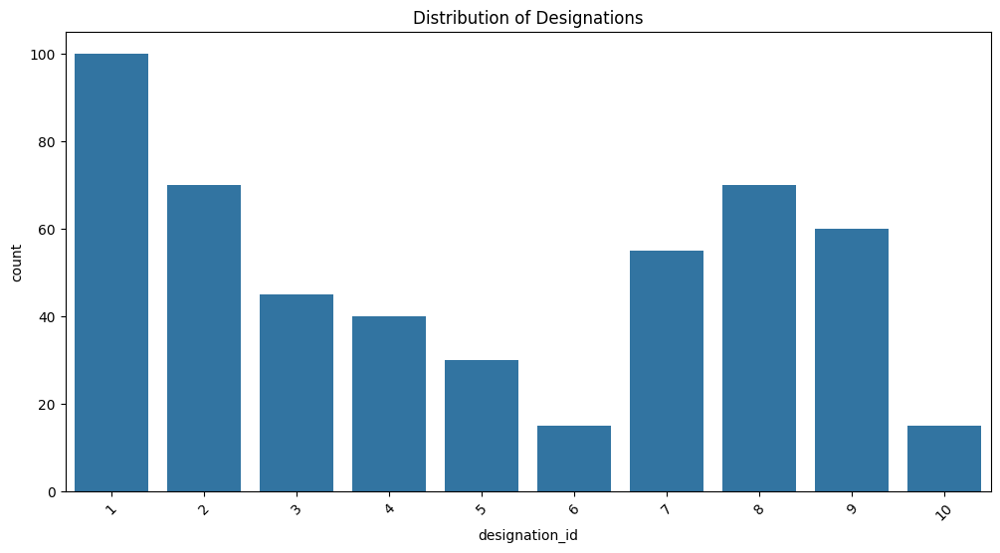

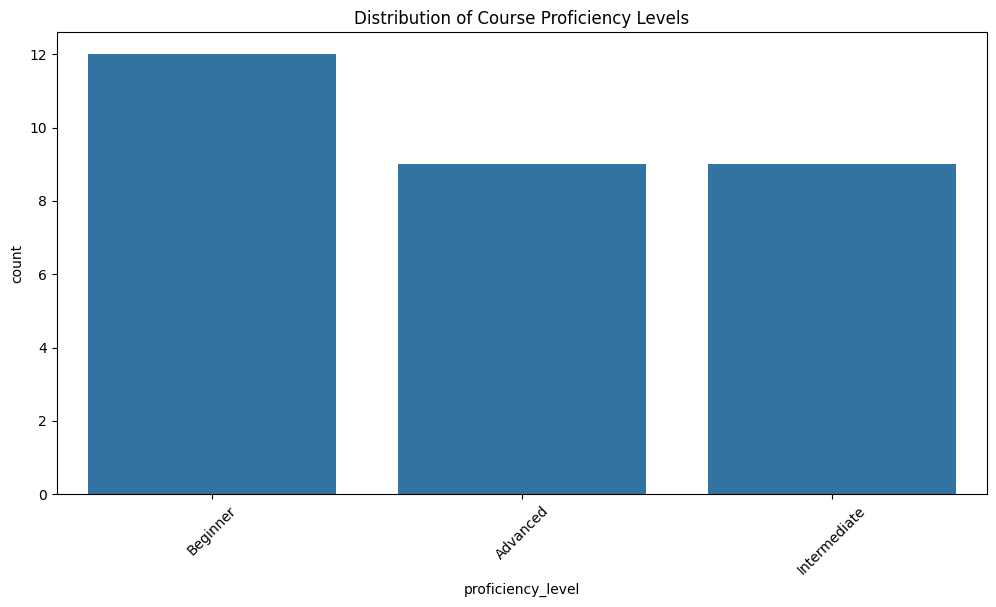

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load datasets
courses_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_courses.csv')
progress_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_progress.csv')
users_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_users.csv')
user_skills_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\user_skills.csv')
designations_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\designations.csv')
designations_skill_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\designations_skill.csv')

# Check the data
print(courses_df.head())
print(progress_df.head())
print(users_df.head())
print(user_skills_df.head())

# EDA: Check distributions of courses and users
plt.figure(figsize=(12, 6))
sns.countplot(data=users_df, x='designation_id')
plt.title('Distribution of Designations')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(data=courses_df, x='proficiency_level')
plt.title('Distribution of Course Proficiency Levels')
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Merge user skills with designations to find missing skills
user_skills_with_designations = pd.merge(user_skills_df, designations_skill_df, left_on='skillId',  right_on='skill_id', how='left')
user_skills_with_designations = pd.merge(user_skills_with_designations, designations_df, on='id', how='left')

# Create a list of required skills for each designation
required_skills_per_designation = user_skills_with_designations.groupby('id')['skill_id'].apply(list).reset_index()
required_skills_per_designation.columns = ['id', 'required_skills']

# Create a list of available skills for each course
course_skills = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')
course_skills_list = course_skills.groupby('courseId')['skillId'].apply(list).reset_index()
course_skills_list.columns = ['courseId', 'available_skills']

# Merge required skills with courses to check for matches


In [ ]:
print("Required Skills Columns:", required_skills_per_designation.columns.tolist())
print("Course Skills List Columns:", course_skills_list.columns.tolist())


Required Skills Columns: ['designation_id', 'required_skills']
Course Skills List Columns: ['courseId', 'available_skills']


In [ ]:
required_skills_per_designation['required_skills'] = required_skills_per_designation['required_skills'].apply(lambda x: x if isinstance(x, list) else [x])
course_skills_list['available_skills'] = course_skills_list['available_skills'].apply(lambda x: x if isinstance(x, list) else [x])

# Explode the DataFrames to have one skill per row
required_skills_per_designation = required_skills_per_designation.explode('required_skills')
course_skills_list = course_skills_list.explode('available_skills')

# Merge required skills with courses based on skills
course_recommendations = pd.merge(
    required_skills_per_designation,
    course_skills_list,
    left_on='required_skills',  # Match against the available skills list
    right_on='available_skills',  # Match against the available skills list
    how='inner'
)

In [ ]:
print(required_skills_per_designation.columns)
print(course_skills_list.columns)


Index(['id', 'required_skills'], dtype='object')
Index(['courseId', 'available_skills'], dtype='object')


   courseId                                          title proficiency_level  \
0         1                    Java Programming Essentials          Beginner   
1         2  Mastering Java Swing for Desktop Applications          Beginner   
2         3                        SQL for Data Management          Advanced   
3         4                    C Programming for Beginners          Beginner   
4         5                         Advanced C# Techniques          Advanced   

   chapters  duration  course_age duration_category  \
0         5         2        1634             Short   
1         9        10        1487              Long   
2        10        10         150              Long   
3        15         7        1096            Medium   
4         7         5        1321            Medium   

   proficiency_level_encoded  created_day  created_month  created_year  
0                          1           18              4          2020  
1                          1           12 

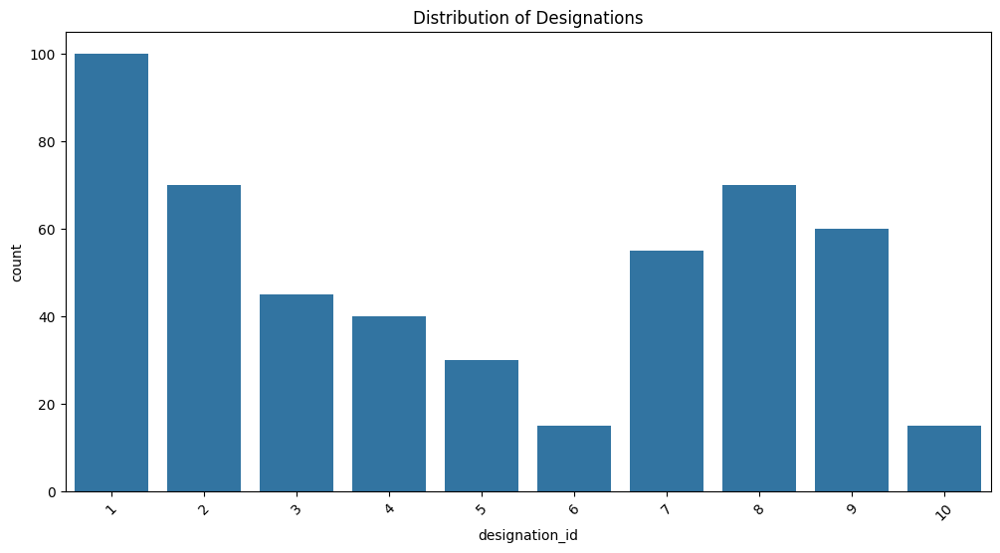

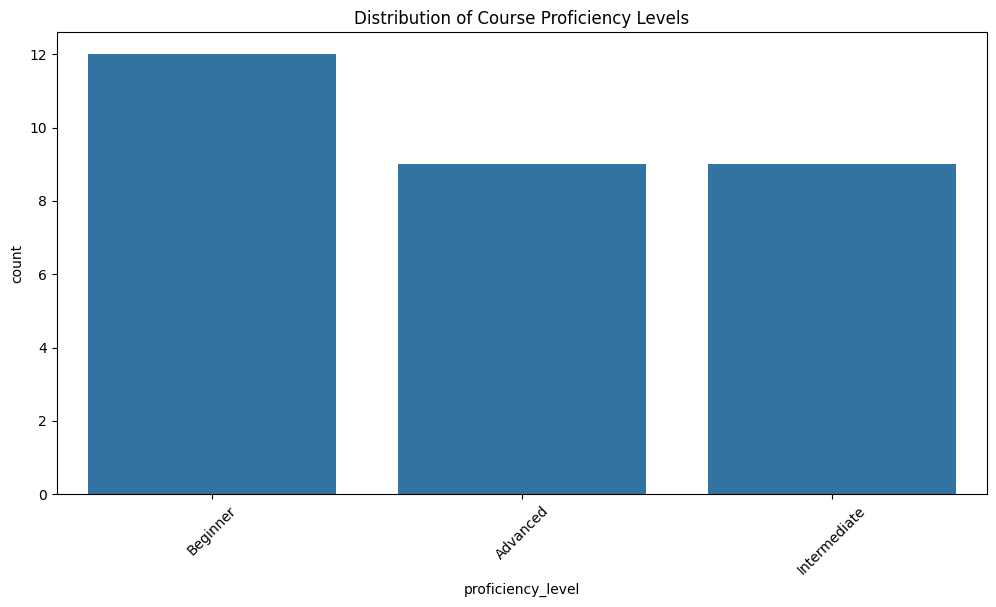

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load datasets
courses_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_courses.csv')
progress_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_progress.csv')
users_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\transformed\\transformed_users.csv')
user_skills_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\user_skills.csv')
designations_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\designations.csv')
designations_skill_df = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\designations_skill.csv')

# Check the data
print(courses_df.head())
print(progress_df.head())
print(users_df.head())
print(user_skills_df.head())

# EDA: Check distributions of courses and users
plt.figure(figsize=(12, 6))
sns.countplot(data=users_df, x='designation_id')
plt.title('Distribution of Designations')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(data=courses_df, x='proficiency_level')
plt.title('Distribution of Course Proficiency Levels')
plt.xticks(rotation=45)
plt.show()


In [ ]:
# Merge user skills with designations to find missing skills
user_skills_with_designations = pd.merge(user_skills_df, designations_skill_df, left_on='skillId',  right_on='skill_id', how='left')
user_skills_with_designations = pd.merge(user_skills_with_designations, designations_df, on='id', how='left')

# Create a list of required skills for each designation
required_skills_per_designation = user_skills_with_designations.groupby('id')['skill_id'].apply(list).reset_index()
required_skills_per_designation.columns = ['id', 'required_skills']

# Create a list of available skills for each course
course_skills = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')
course_skills_list = course_skills.groupby('courseId')['skillId'].apply(list).reset_index()
course_skills_list.columns = ['courseId', 'available_skills']

# Merge required skills with courses to check for matches


In [ ]:
print("Required Skills Columns:", required_skills_per_designation.columns.tolist())
print("Course Skills List Columns:", course_skills_list.columns.tolist())


Required Skills Columns: ['designation_id', 'required_skills']
Course Skills List Columns: ['courseId', 'available_skills']


In [ ]:
required_skills_per_designation['required_skills'] = required_skills_per_designation['required_skills'].apply(lambda x: x if isinstance(x, list) else [x])
course_skills_list['available_skills'] = course_skills_list['available_skills'].apply(lambda x: x if isinstance(x, list) else [x])

# Explode the DataFrames to have one skill per row
required_skills_per_designation = required_skills_per_designation.explode('required_skills')
course_skills_list = course_skills_list.explode('available_skills')

# Merge required skills with courses based on skills
course_recommendations = pd.merge(
    required_skills_per_designation,
    course_skills_list,
    left_on='required_skills',  # Match against the available skills list
    right_on='available_skills',  # Match against the available skills list
    how='inner'
)

In [ ]:
print(required_skills_per_designation.columns)
print(course_skills_list.columns)


Index(['id', 'required_skills'], dtype='object')
Index(['courseId', 'available_skills'], dtype='object')


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a list of available skills for each course
course_skills = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')
course_skills_list = course_skills.groupby('courseId')['skillId'].apply(lambda x: ', '.join(map(str, x))).reset_index()
course_skills_list.columns = ['courseId', 'available_skills']

# Create TF-IDF features for available skills
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(course_skills_list['available_skills'])

# Create a DataFrame for course similarity
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

# Function to get course recommendations based on content similarity
def get_content_based_recommendations(course_id, num_recommendations=5):
    # Get index of the course that matches the course_id
    idx = course_skills_list[course_skills_list['courseId'] == course_id].index[0]
    
    # Get the pairwise similarity scores of all courses with that course
    sim_scores = list(enumerate(cosine_sim[idx]))
    
    # Sort the courses based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar courses
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the course indices
    course_indices = [i[0] for i in sim_scores]
    
    # Return the top most similar courses
    return course_skills_list['courseId'].iloc[course_indices].tolist()


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

# Function to get course recommendations based on content similarity
def get_content_based_recommendations(course_id, num_recommendations=5):
    # Get index of the course that matches the course_id
    idx = course_skills_list[course_skills_list['courseId'] == course_id].index[0]
    
    # Get the pairwise similarity scores of all courses with that course
    sim_scores = list(enumerate(cosine_sim[idx]))
    
    # Sort the courses based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar courses
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the course indices
    course_indices = [i[0] for i in sim_scores]
    
    # Return the top most similar courses
    return course_skills_list['courseId'].iloc[course_indices].tolist()


In [ ]:
# User-Item matrix creation
user_course_matrix = progress_df.pivot_table(index='userId', columns='courseId', values='percentage_completed', fill_value=0)

# Calculate cosine similarity
user_similarity = cosine_similarity(user_course_matrix)

# Function to get collaborative filtering recommendations
def get_collaborative_recommendations(user_id, num_recommendations=5):
    # Get index of the user that matches user_id
    idx = users_df[users_df['user_id'] == user_id].index[0]
    
    # Get the pairwise similarity scores of all users with that user
    sim_scores = list(enumerate(user_similarity[idx]))
    
    # Sort the users based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar users
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the user indices
    user_indices = [i[0] for i in sim_scores]
    
    # Get recommended courses for those users
    recommended_courses = user_course_matrix.iloc[user_indices].sum(axis=0).sort_values(ascending=False)
    return recommended_courses[recommended_courses > 0].index.tolist()[:num_recommendations]


In [ ]:
# Load the course skills data
course_skills_list = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')

# Convert skillId to strings and then join
course_skills = course_skills_list.groupby('courseId')['skillId'].apply(lambda x: ' '.join(x.astype(str))).reset_index()
course_skills.columns = ['courseId', 'skills']

# Now you can proceed with your further operations
print(course_skills)

    courseId          skills
0          1           27 31
1          2          28 6 3
2          3   29 13 31 26 1
3          4            16 7
4          5              10
5          6               5
6          7               7
7          8      31 30 18 7
8          9  15 17 14 27 21
9         10              17
10        11         9 22 24
11        12           31 23
12        13   11 27 15 20 7
13        14            25 7
14        15           17 25
15        16            5 21
16        17            24 9
17        18          9 5 21
18        19        25 26 12
19        20   9 14 23 27 17
20        21         23 5 10
21        22      16 29 9 28
22        23               9
23        24    21 4 8 30 11
24        25       3 4 28 13
25        26         4 30 31
26        27      16 32 15 5
27        28   10 14 8 16 23
28        29         19 7 18
29        30               8


user_id = 1  
course_id = 1  

recommended_courses = hybrid_recommendation(user_id, course_id)

print("Recommended Courses:")
print(recommended_courses)


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

# Create a TF-IDF vectorizer
tfidf = TfidfVectorizer()

# Transform the skills into a TF-IDF matrix
tfidf_matrix = tfidf.fit_transform(course_skills['skills'])

# Compute the cosine similarity matrix
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

# Function to get course recommendations based on content
def get_content_recommendations(course_id, cosine_sim=cosine_sim):
    idx = course_skills[course_skills['courseId'] == course_id].index[0]
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    course_indices = [i[0] for i in sim_scores[1:6]]  # Top 5 recommendations
    return course_skills['courseId'].iloc[course_indices].values
from sklearn.decomposition import TruncatedSVD

# Fit SVD on the user-course matrix
svd = TruncatedSVD(n_components=5)
matrix_factorization = svd.fit_transform(user_course_matrix)

# Function to get collaborative recommendations
def get_collaborative_recommendations(user_id, user_course_matrix=user_course_matrix):
    user_idx = user_course_matrix.index.get_loc(user_id)
    sim_scores = user_course_matrix.dot(matrix_factorization[user_idx])
    course_indices = sim_scores.argsort()[-5:][::-1]  # Top 5 recommendations
    return user_course_matrix.columns[course_indices].values
def hybrid_recommendations(user_id, course_id):
    content_recs = get_content_recommendations(course_id)
    collaborative_recs = get_collaborative_recommendations(user_id)
    # Combine and remove duplicates
    recommendations = set(content_recs) | set(collaborative_recs)
    return list(recommendations)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error
import numpy as np

def evaluate_model(predictions, true_labels):
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    rmse = np.sqrt(mean_squared_error(true_labels, predictions))
    
    return {
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'RMSE': rmse
    }


In [ ]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(user_course_matrix, test_size=0.2, random_state=42)
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error
import numpy as np

def evaluate_model(predictions, true_labels):
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    rmse = np.sqrt(mean_squared_error(true_labels, predictions))
    
    return {
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'RMSE': rmse
    }


In [ ]:
from sklearn.decomposition import TruncatedSVD

# Fit SVD on the user-course matrix, adjusting components
svd = TruncatedSVD(n_components=30)  # Match this with the number of courses
matrix_factorization = svd.fit_transform(user_course_matrix)

def get_collaborative_recommendations(user_id):
    user_idx = user_course_matrix.index.get_loc(user_id)
    # Ensure that the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)  # Transpose to align dimensions
    sim_scores = sim_scores.values.flatten()  # Convert to a NumPy array and flatten it

    # Get the top 5 indices, ensuring we do not exceed the length of available columns
    num_courses = user_course_matrix.shape[1]  # Number of courses
    course_indices = sim_scores.argsort()[-5:][::-1]  # Top 5 recommendations

    # Filter course_indices to ensure they are within bounds
    valid_course_indices = [i for i in course_indices if i < num_courses]
    
    return user_course_matrix.columns[valid_course_indices].values


def get_predictions(user_id, course_id, method='hybrid'):
    if method == 'content':
        return get_content_recommendations(course_id)
    elif method == 'collaborative':
        return get_collaborative_recommendations(user_id)
    elif method == 'hybrid':
        return hybrid_recommendations(user_id, course_id)
    else:
        raise ValueError("Unknown method specified.")

# When calling for predictions
for user_id in test_data.index:
    for course_id in test_data.columns:
        if test_data.loc[user_id, course_id] > 0:  # If the user has interacted with this course
            # Get predictions from all three methods
            content_preds = get_predictions(user_id, course_id, method='content')
            collaborative_preds = get_predictions(user_id, course_id, method='collaborative')
            hybrid_preds = get_predictions(user_id, course_id, method='hybrid')


In [ ]:
def get_collaborative_recommendations(user_id):
    # Check if the user exists in the user-course matrix
    if user_id not in user_course_matrix.index:
        return ["No collaborative recs"]  # Return no recommendation if user not found
    
    user_idx = user_course_matrix.index.get_loc(user_id)  # Get the index for the user
    
    # Ensure the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)
    
    # Check if user_idx is within the bounds of sim_scores
    if user_idx >= sim_scores.shape[0]:
        return ["No collaborative recs"]
    
    sim_scores = sim_scores[user_idx, :].flatten()  # Get scores for this user
    
    # Get top 5 course indices
    course_indices = np.argsort(sim_scores)[-5:][::-1]
    
    # Filter out any indices that are out of bounds
    valid_course_indices = [i for i in course_indices if i < user_course_matrix.shape[1]]
    
    if len(valid_course_indices) > 0:
        return user_course_matrix.columns[valid_course_indices].values
    else:
        return ["No collaborative recs"]


In [ ]:
from sklearn.decomposition import TruncatedSVD
import numpy as np

# Fit SVD on the user-course matrix
svd = TruncatedSVD(n_components=30)  # Adjust number of components based on your data
matrix_factorization = svd.fit_transform(user_course_matrix)
def get_predictions(user_id, course_id, method='hybrid'):
    if method == 'content':
        return get_content_recommendations(course_id)
    elif method == 'collaborative':
        return get_collaborative_recommendations(user_id)
    elif method == 'hybrid':
        return hybrid_recommendations(user_id, course_id)
    else:
        raise ValueError("Unknown method specified.")


In [ ]:
# Assuming user_ids and course_ids are defined from your test data
for user_id in tqdm(user_ids, desc="Generating recommendations"):
    for course_id in course_ids:
        if test_data.loc[user_id, course_id] > 0:  # Check if the user interacted with the course
            # Get predictions from all models
            content_preds = get_predictions(user_id, course_id, method='content')
            collaborative_preds = get_predictions(user_id, course_id, method='collaborative')
            hybrid_preds = get_predictions(user_id, course_id, method='hybrid')
            # Store or print the recommendations as needed
            print(f"User: {user_id}, Content-based: {content_preds}, Collaborative: {collaborative_preds}, Hybrid: {hybrid_preds}")


NameError: name 'user_ids' is not defined

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Create a list of available skills for each course
course_skills = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')
course_skills_list = course_skills.groupby('courseId')['skillId'].apply(lambda x: ', '.join(map(str, x))).reset_index()
course_skills_list.columns = ['courseId', 'available_skills']

# Create TF-IDF features for available skills
tfidf = TfidfVectorizer()
tfidf_matrix = tfidf.fit_transform(course_skills_list['available_skills'])

# Create a DataFrame for course similarity
tfidf_df = pd.DataFrame(tfidf_matrix.toarray(), columns=tfidf.get_feature_names_out())


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

# Function to get course recommendations based on content similarity
def get_content_based_recommendations(course_id, num_recommendations=5):
    # Get index of the course that matches the course_id
    idx = course_skills_list[course_skills_list['courseId'] == course_id].index[0]
    
    # Get the pairwise similarity scores of all courses with that course
    sim_scores = list(enumerate(cosine_sim[idx]))
    
    # Sort the courses based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar courses
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the course indices
    course_indices = [i[0] for i in sim_scores]
    
    # Return the top most similar courses
    return course_skills_list['courseId'].iloc[course_indices].tolist()


In [ ]:
from sklearn.metrics.pairwise import cosine_similarity

# Compute the cosine similarity matrix
cosine_sim = cosine_similarity(tfidf_matrix)

# Function to get course recommendations based on content similarity
def get_content_based_recommendations(course_id, num_recommendations=5):
    # Get index of the course that matches the course_id
    idx = course_skills_list[course_skills_list['courseId'] == course_id].index[0]
    
    # Get the pairwise similarity scores of all courses with that course
    sim_scores = list(enumerate(cosine_sim[idx]))
    
    # Sort the courses based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar courses
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the course indices
    course_indices = [i[0] for i in sim_scores]
    
    # Return the top most similar courses
    return course_skills_list['courseId'].iloc[course_indices].tolist()


In [ ]:
# User-Item matrix creation
user_course_matrix = progress_df.pivot_table(index='userId', columns='courseId', values='percentage_completed', fill_value=0)

# Calculate cosine similarity
user_similarity = cosine_similarity(user_course_matrix)

# Function to get collaborative filtering recommendations
def get_collaborative_recommendations(user_id, num_recommendations=5):
    # Get index of the user that matches user_id
    idx = users_df[users_df['user_id'] == user_id].index[0]
    
    # Get the pairwise similarity scores of all users with that user
    sim_scores = list(enumerate(user_similarity[idx]))
    
    # Sort the users based on the similarity scores
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    # Get the scores of the most similar users
    sim_scores = sim_scores[1:num_recommendations+1]
    
    # Get the user indices
    user_indices = [i[0] for i in sim_scores]
    
    # Get recommended courses for those users
    recommended_courses = user_course_matrix.iloc[user_indices].sum(axis=0).sort_values(ascending=False)
    return recommended_courses[recommended_courses > 0].index.tolist()[:num_recommendations]


In [ ]:
# Load the course skills data
course_skills_list = pd.read_csv('C:\\Users\\AnanyaSarkar\\Documents\\project\\datascienceandengg\\staging\\raw\\course_skills.csv')

# Convert skillId to strings and then join
course_skills = course_skills_list.groupby('courseId')['skillId'].apply(lambda x: ' '.join(x.astype(str))).reset_index()
course_skills.columns = ['courseId', 'skills']

# Now you can proceed with your further operations
print(course_skills)

    courseId          skills
0          1           27 31
1          2          28 6 3
2          3   29 13 31 26 1
3          4            16 7
4          5              10
5          6               5
6          7               7
7          8      31 30 18 7
8          9  15 17 14 27 21
9         10              17
10        11         9 22 24
11        12           31 23
12        13   11 27 15 20 7
13        14            25 7
14        15           17 25
15        16            5 21
16        17            24 9
17        18          9 5 21
18        19        25 26 12
19        20   9 14 23 27 17
20        21         23 5 10
21        22      16 29 9 28
22        23               9
23        24    21 4 8 30 11
24        25       3 4 28 13
25        26         4 30 31
26        27      16 32 15 5
27        28   10 14 8 16 23
28        29         19 7 18
29        30               8


user_id = 1  
course_id = 1  

recommended_courses = hybrid_recommendation(user_id, course_id)

print("Recommended Courses:")
print(recommended_courses)


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel

# Create a TF-IDF vectorizer
tfidf = TfidfVectorizer()

# Transform the skills into a TF-IDF matrix
tfidf_matrix = tfidf.fit_transform(course_skills['skills'])

# Compute the cosine similarity matrix
cosine_sim = linear_kernel(tfidf_matrix, tfidf_matrix)

# Function to get course recommendations based on content
def get_content_recommendations(course_id, cosine_sim=cosine_sim):
    idx = course_skills[course_skills['courseId'] == course_id].index[0]
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    course_indices = [i[0] for i in sim_scores[1:6]]  # Top 5 recommendations
    return course_skills['courseId'].iloc[course_indices].values
from sklearn.decomposition import TruncatedSVD

# Fit SVD on the user-course matrix
svd = TruncatedSVD(n_components=5)
matrix_factorization = svd.fit_transform(user_course_matrix)

# Function to get collaborative recommendations
def get_collaborative_recommendations(user_id, user_course_matrix=user_course_matrix):
    user_idx = user_course_matrix.index.get_loc(user_id)
    sim_scores = user_course_matrix.dot(matrix_factorization[user_idx])
    course_indices = sim_scores.argsort()[-5:][::-1]  # Top 5 recommendations
    return user_course_matrix.columns[course_indices].values
def hybrid_recommendations(user_id, course_id):
    content_recs = get_content_recommendations(course_id)
    collaborative_recs = get_collaborative_recommendations(user_id)
    # Combine and remove duplicates
    recommendations = set(content_recs) | set(collaborative_recs)
    return list(recommendations)


In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error
import numpy as np

def evaluate_model(predictions, true_labels):
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    rmse = np.sqrt(mean_squared_error(true_labels, predictions))
    
    return {
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'RMSE': rmse
    }


In [ ]:
from sklearn.model_selection import train_test_split

train_data, test_data = train_test_split(user_course_matrix, test_size=0.2, random_state=42)
from sklearn.metrics import precision_score, recall_score, f1_score, mean_squared_error
import numpy as np

def evaluate_model(predictions, true_labels):
    precision = precision_score(true_labels, predictions, average='weighted')
    recall = recall_score(true_labels, predictions, average='weighted')
    f1 = f1_score(true_labels, predictions, average='weighted')
    rmse = np.sqrt(mean_squared_error(true_labels, predictions))
    
    return {
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1,
        'RMSE': rmse
    }


In [ ]:
from sklearn.decomposition import TruncatedSVD

# Fit SVD on the user-course matrix, adjusting components
svd = TruncatedSVD(n_components=30)  # Match this with the number of courses
matrix_factorization = svd.fit_transform(user_course_matrix)

def get_collaborative_recommendations(user_id):
    user_idx = user_course_matrix.index.get_loc(user_id)
    # Ensure that the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)  # Transpose to align dimensions
    sim_scores = sim_scores.values.flatten()  # Convert to a NumPy array and flatten it

    # Get the top 5 indices, ensuring we do not exceed the length of available columns
    num_courses = user_course_matrix.shape[1]  # Number of courses
    course_indices = sim_scores.argsort()[-5:][::-1]  # Top 5 recommendations

    # Filter course_indices to ensure they are within bounds
    valid_course_indices = [i for i in course_indices if i < num_courses]
    
    return user_course_matrix.columns[valid_course_indices].values


def get_predictions(user_id, course_id, method='hybrid'):
    if method == 'content':
        return get_content_recommendations(course_id)
    elif method == 'collaborative':
        return get_collaborative_recommendations(user_id)
    elif method == 'hybrid':
        return hybrid_recommendations(user_id, course_id)
    else:
        raise ValueError("Unknown method specified.")

# When calling for predictions
for user_id in test_data.index:
    for course_id in test_data.columns:
        if test_data.loc[user_id, course_id] > 0:  # If the user has interacted with this course
            # Get predictions from all three methods
            content_preds = get_predictions(user_id, course_id, method='content')
            collaborative_preds = get_predictions(user_id, course_id, method='collaborative')
            hybrid_preds = get_predictions(user_id, course_id, method='hybrid')


In [132]:
def get_collaborative_recommendations(user_id):
    # Check if the user exists in the user-course matrix
    if user_id not in user_course_matrix.index:
        return ["No collaborative recs"]  # Return no recommendation if user not found

    user_idx = user_course_matrix.index.get_loc(user_id)  # Get the index for the user
    print(f"User Index: {user_idx}")

    # Ensure the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)
    print(f"Sim Scores Shape: {sim_scores.shape}")

    # Get scores for this user
    if user_idx < sim_scores.shape[0]:
        user_sim_scores = sim_scores[user_idx].values.flatten()
    else:
        return ["No collaborative recs"]

    print(f"User Sim Scores: {user_sim_scores}")

    # Get top 5 course indices
    course_indices = np.argsort(user_sim_scores)[-5:][::-1]
    print(f"Course Indices: {course_indices}")

    # Filter out any indices that are out of bounds
    valid_course_indices = [i for i in course_indices if i < user_course_matrix.shape[1]]
    
    if len(valid_course_indices) > 0:
        return user_course_matrix.columns[valid_course_indices].values
    else:
        return ["No collaborative recs"]


In [133]:
from sklearn.decomposition import TruncatedSVD
import numpy as np

# Fit SVD on the user-course matrix
svd = TruncatedSVD(n_components=30)  # Adjust number of components based on your data
matrix_factorization = svd.fit_transform(user_course_matrix)
def get_predictions(user_id, course_id, method='hybrid'):
    if method == 'content':
        return get_content_recommendations(course_id)
    elif method == 'collaborative':
        return get_collaborative_recommendations(user_id)
    elif method == 'hybrid':
        return hybrid_recommendations(user_id, course_id)
    else:
        raise ValueError("Unknown method specified.")


In [158]:
import numpy as np

def get_collaborative_recommendations(user_id):
    # Check if the user exists in the user-course matrix
    if user_id not in user_course_matrix.index:
        return ["No collaborative recs"]  # Return no recommendation if user not found
    
    user_idx = user_course_matrix.index.get_loc(user_id)  # Get the index for the user
    
    # Ensure the dot product dimensions match
    sim_scores = user_course_matrix.dot(matrix_factorization.T)

    sim_scores = sim_scores[user_idx].values  # Get scores for this user

    # Get top 3 course indices
    course_indices = np.argsort(sim_scores)[-3:][::-1]  # Top 3 recommendations

    # Filter out any indices that are out of bounds
    valid_course_indices = [i for i in course_indices if i < user_course_matrix.shape[1]]
    
    if len(valid_course_indices) > 0:
        return user_course_matrix.columns[valid_course_indices].values.tolist()  # Return as a list
    else:
        return ["No collaborative recs"]

def get_recommended_course(user_id):
    """Return top 3 recommended courses for the given user_id based on collaborative filtering."""
    # Get collaborative recommendations
    collaborative_recommendations = get_collaborative_recommendations(user_id)

    if collaborative_recommendations and collaborative_recommendations[0] != "No collaborative recs":
        return collaborative_recommendations  # Return the top 3 recommended courses
    else:
        return ["No recommendations available"]

# Example usage
user_id = 250  # Replace with the desired userId
recommended_courses = get_recommended_course(user_id)
print(f"Top 3 recommended courses for user {user_id}: {recommended_courses}")


Top 3 recommended courses for user 250: [2]


In [174]:
import pandas as pd
import random

def get_recommended_courses(user_id):
    # Load the data from CSV files
    user_skills_df = pd.read_csv('C:/Users/AnanyaSarkar/Documents/project/datascienceandengg/staging/raw/user_skills.csv')
    designations_skill_df = pd.read_csv('C:/Users/AnanyaSarkar/Documents/project/datascienceandengg/staging/raw/designations_skill.csv')
    course_skills_df = pd.read_csv('C:/Users/AnanyaSarkar/Documents/project/datascienceandengg/staging/raw/course_skills.csv')
    progress_df = pd.read_csv('C:/Users/AnanyaSarkar/Documents/project/datascienceandengg/staging/transformed/transformed_progress.csv')
    courses_df = pd.read_csv('C:/Users/AnanyaSarkar/Documents/project/datascienceandengg/staging/transformed/transformed_courses.csv')
    
    # Get the user's skills
    user_skills = user_skills_df[user_skills_df['userId'] == user_id]['skillId'].tolist()
    print(f"User Skills for User {user_id}: {user_skills}")
    
    # Assuming there's a way to get the designation_id. 
    # This part might need adjustment if the designation is stored elsewhere.
    designation_id = user_skills_df[user_skills_df['userId'] == user_id]['skillId'].unique()[0]
    
    # Get skills required for the user's designation
    required_skills = designations_skill_df[designations_skill_df['designation_id'] == designation_id]['skill_id'].tolist()
    print(f"Required Skills for Designation {designation_id}: {required_skills}")

    # Find courses that require the user's current skills
    course_ids_with_required_skills = course_skills_df[course_skills_df['skillId'].isin(required_skills)]['courseId'].unique().tolist()
    print(f"Course IDs with Required Skills: {course_ids_with_required_skills}")

    # Filter out courses the user is already enrolled in
    enrolled_courses = progress_df[progress_df['userId'] == user_id]['courseId'].tolist()
    print(f"Enrolled Courses for User {user_id}: {enrolled_courses}")

    valid_courses = [course_id for course_id in course_ids_with_required_skills if course_id not in enrolled_courses]
    print(f"Valid Courses after filtering: {valid_courses}")

    # Check if there are valid courses available
    if not valid_courses:
        return "No course recommendations available."
    
    # Randomly select 3 courses from the valid list
    recommended_courses = random.sample(valid_courses, min(3, len(valid_courses)))
    
    # Get course titles for the recommended course IDs
    recommended_courses_info = courses_df[courses_df['courseId'].isin(recommended_courses)][['courseId', 'title']]
    
    return recommended_courses_info

# Example usage
user_id = 210  # replace with the actual userId you want to test
recommended_courses = get_recommended_courses(user_id)
print(recommended_courses)


User Skills for User 210: [6, 16]
Required Skills for Designation 6: [20, 22, 25]
Course IDs with Required Skills: [11, 13, 14, 15, 19]
Enrolled Courses for User 210: [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 1, 1, 1, 2, 2, 3, 3, 4, 4, 5, 5, 6, 7, 7, 7, 7, 7, 8, 8, 8, 8, 9, 9, 9, 10, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 17, 17, 18, 19, 19, 19, 20, 20, 20, 21, 22, 22, 22, 23, 24, 24, 25, 25, 25, 25, 25, 26, 26, 26, 26, 27, 27, 27, 27, 28, 29, 30, 30]
Valid Courses after filtering: []
No course recommendations available.
